# Import Libraries

In [1]:
# for operations on data
import numpy as np
import pandas as pd
# for visualisation of data
import seaborn as sns
import matplotlib.pyplot as plt
# for making connection with database
import pyodbc
import pymssql
# for time
from datetime import datetime
# for making widgets
import ipywidgets as widgets
from IPython.display import display
# for statistical processing
from scipy import stats

# Import Helper Functions

In [2]:
# contains helping functions
from helper import *
# contains functions to make connection with database
from connector import *
# contains functions to read data from database
from tableReader import *
# contains classes to carry-out calculations
from companion import *

# Connect to the Database

In [3]:
#################### Connection with Manual Login Details via pyodbc ########################
# conn = connect_manual_via_pyodbc() # from connector.py
    
############################# Default Connection via pyodbc ################################
conn = connect_default_via_pyodbc() # from connector.py   


#################### Connection with Manual Login Details via pymssql ########################
# conn = connect_manual_via_pymssql() # from connector.py
    
############################# Default Connection via pymssql ################################
# conn = connect_default_via_pymssql() # from connector.py  

 
Successfully Connected to the Database


# Choose Time Interval

In [5]:
# choose time period via dropdown
vis, mo, choosen_y, choosen_m, choosen_q, sd, ed = choose_period() # from helper.py

(For visualisation w.r.t. Month/Quarter enter 1, else enter 2)  1


Dropdown(description='Year:', index=5, options=(('2016', '2016'), ('2017', '2017'), ('2018', '2018'), ('2019',…

Enter 1 to choose months and 2 for Quarters: 1


Dropdown(description='Month:', options=(('January', '01'), ('February', '02'), ('March', '03'), ('April', '04'…

In [6]:
# generate start & end dates corresponding to choosen period
start_date, end_date = choose_start_end_date(vis, mo, choosen_y, choosen_m, choosen_q, sd, ed) # from helper.py

Choosen Start Date is: 2021-09-01 00:00:00
Choosen End Date is: 2021-09-30 23:59:59.999999


###############################################################################################################################

# 0.1 Question Analytics

In [7]:
QA = Question_Analytics(conn, start_date, end_date)

Length of data is: 1162938


,index,QuestionId,_QuestionScore,_SubjectId,CreatedOn,PastYearAppearance,CourseId,CourseName,SubjectName
0,0,161,0.25,1,NaT,,1,JEE,Physics
1,1,161,0.25,1,NaT,,4,11/12 CBSE,Physics
2,2,161,0.25,1,NaT,,6,NEET,Physics
3,3,161,0.25,1,NaT,,7,MHCET,Physics
4,5,161,0.25,1,NaT,,17,11/12 HSC,Physics


## new question added

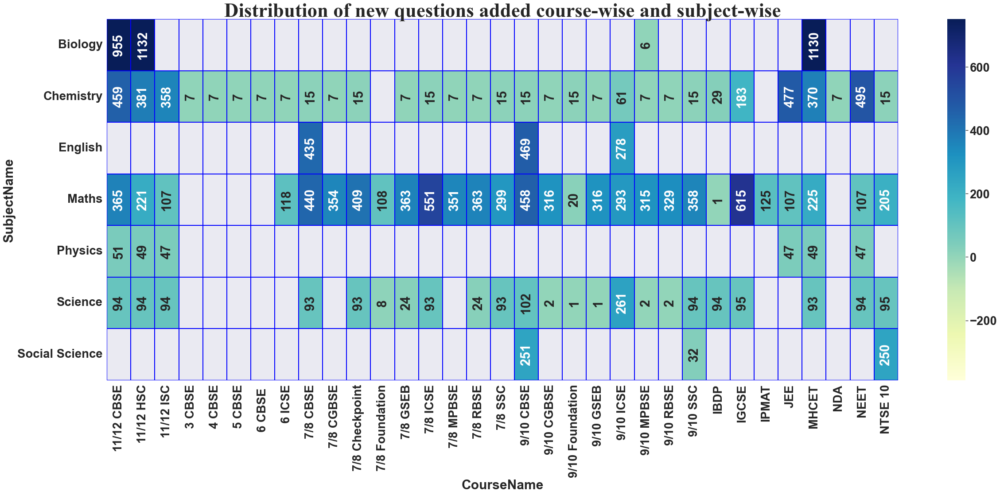

In [8]:
qa1 = QA.cwsw_new_question_added()

## previous year question count

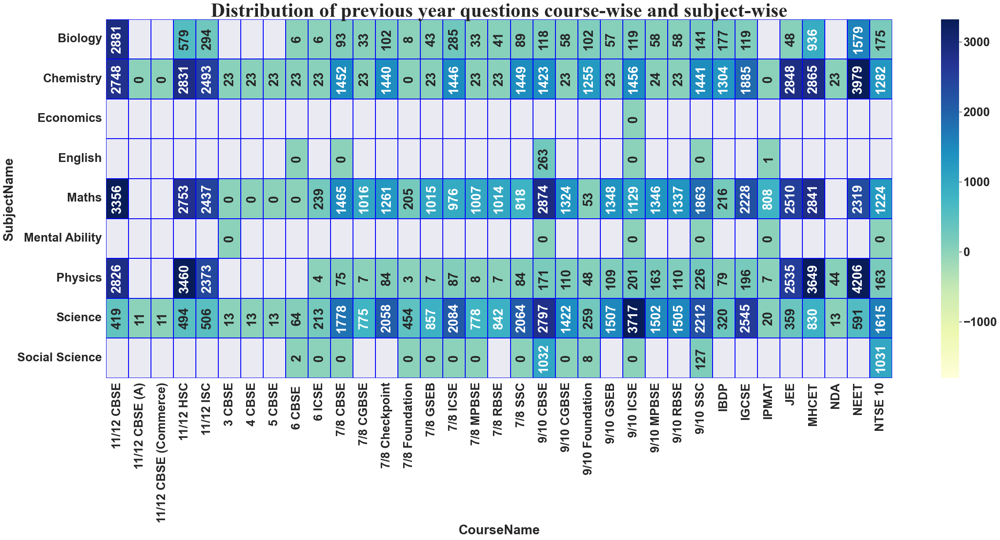

In [9]:
qa2 = QA.cwsw_previous_year_question_count()

## question count by accuracy

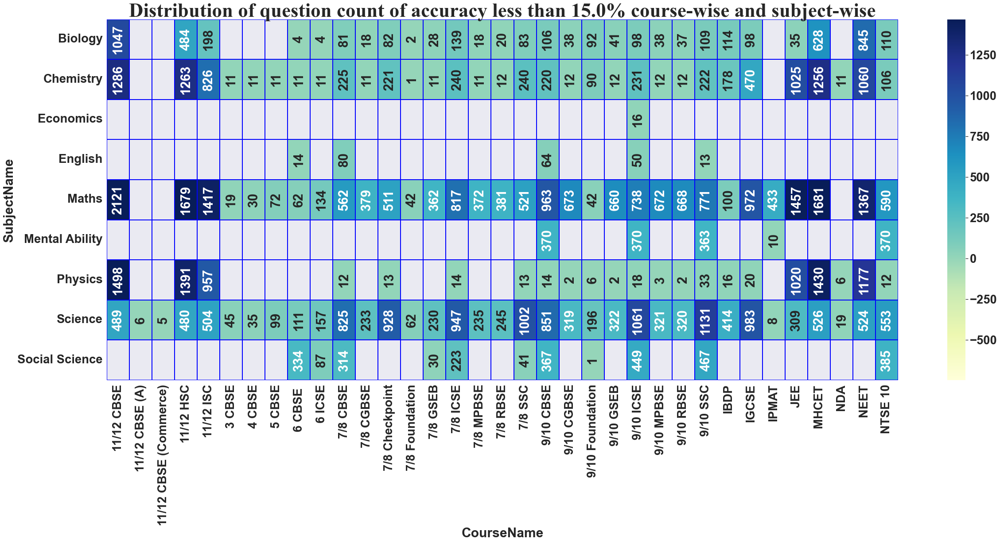

In [10]:
qa3 = QA.cwsw_question_count_by_accuracy()

# 0.2 Error Reports

In [11]:
ER = Error_Reports(conn, start_date, end_date)

Length of data is: 0


,index,QuestionId,CreatedOn,CourseId,CourseName,SubjectName


No Data Found in specified duration


## Reported errors

C:\Users\rialk\anaconda3\lib\site-packages\seaborn\matrix.py:305: UserWarning:

Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.

C:\Users\rialk\anaconda3\lib\site-packages\seaborn\matrix.py:305: UserWarning:

Attempting to set identical bottom == top == 0 results in singular transformations; automatically expanding.



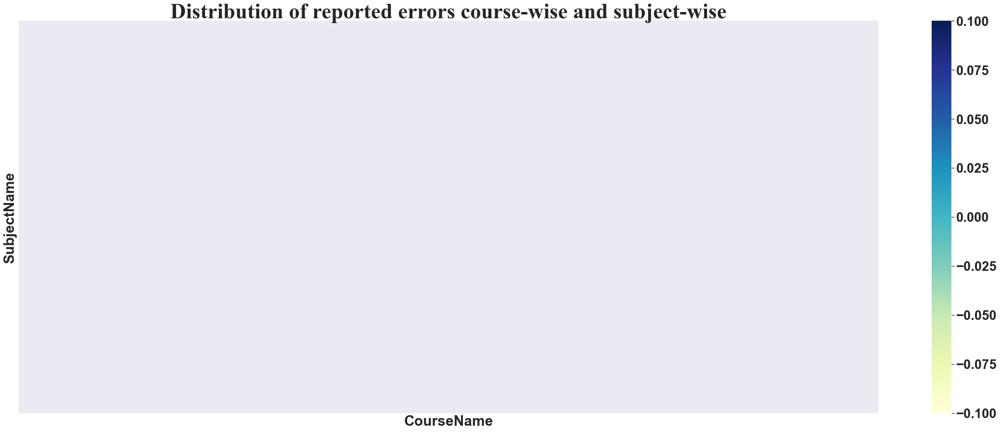

In [12]:
er1 = ER.cwsw_reported_errors()

# 0.3 KSC Analytics

In [13]:
KA = KSC_Analytics(conn, start_date, end_date)

Length of data is: 758


,index,KSCId,CreatedOn,CourseId,CourseName,SubjectName
0,0,34255,2021-09-01 15:02:10.043,10,9/10 ICSE,Economics
1,1,34256,2021-09-01 15:02:27.693,10,9/10 ICSE,Economics
2,2,34257,2021-09-01 15:04:37.623,10,9/10 ICSE,Economics
3,3,34258,2021-09-01 15:05:06.607,10,9/10 ICSE,Economics
4,4,34259,2021-09-01 16:15:35.550,13,7/8 ICSE,Maths


## New KSC Added

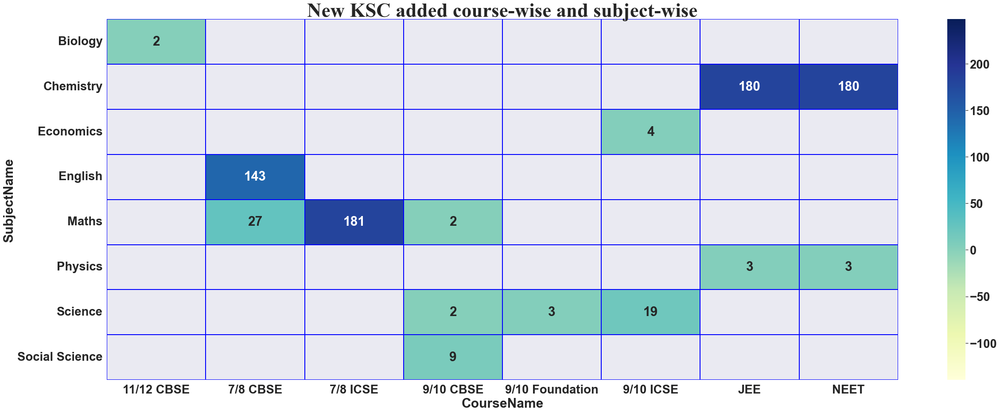

In [14]:
ka1 = KA.cwsw_new_ksc_added()

###############################################################################################################################

# 1. Assignment Session Usage (from Exam tables)
Exam tables contain the data related to Assignments solved by users

In [15]:
AU = Assignment_Usage(conn, start_date, end_date)

Length of data is: 40575


,index,ExamSessionQuestionId,ExamSessionId,QuestionId,StartedOn,CompletedOn,TotalTimeTaken,ExamId,UserId,CourseId,AffiliationCodeId,RoleId,_SubjectId,CourseName,SubjectName
0,0,282541,35959,64588,2021-09-20 16:07:47.070,2021-09-20 16:08:43.960,56,289504,74708,9,930,2,2,7/8 CBSE,Maths
2,2,282701,35963,95427,2021-09-20 16:22:54.097,2021-09-20 16:23:08.193,14,302722,74708,9,930,2,2,7/8 CBSE,Maths
3,3,282704,35963,95429,2021-09-20 16:23:14.223,2021-09-20 16:23:18.207,4,302722,74708,9,930,2,2,7/8 CBSE,Maths
4,4,295367,31872,99766,2021-09-29 20:13:13.400,2021-09-29 20:13:33.430,20,323488,80393,2,1028,2,2,9/10 CBSE,Maths
5,5,295368,31872,99769,2021-09-29 20:13:36.160,2021-09-29 20:13:56.117,20,323488,80393,2,1028,2,2,9/10 CBSE,Maths


## Histogram of Assignment session time

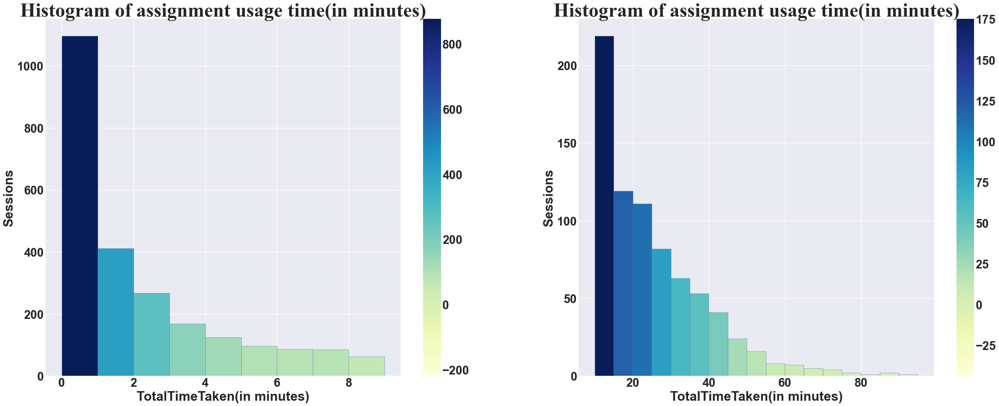

In [16]:
au1 = AU.assignment_usage_time_histogram_range_split()

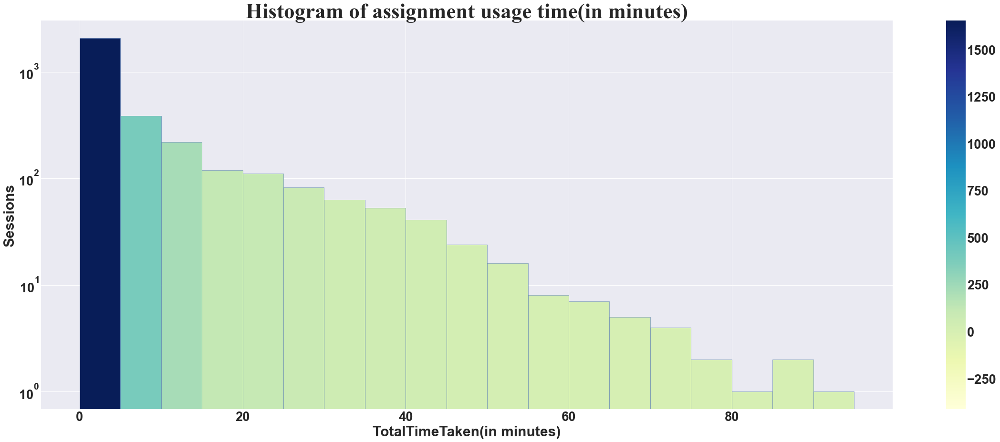

In [17]:
au2 = AU.assignment_usage_time_histogram_logscale()

## Distribution of Assignment sessions course-wise and subject-wise (Heat Map)

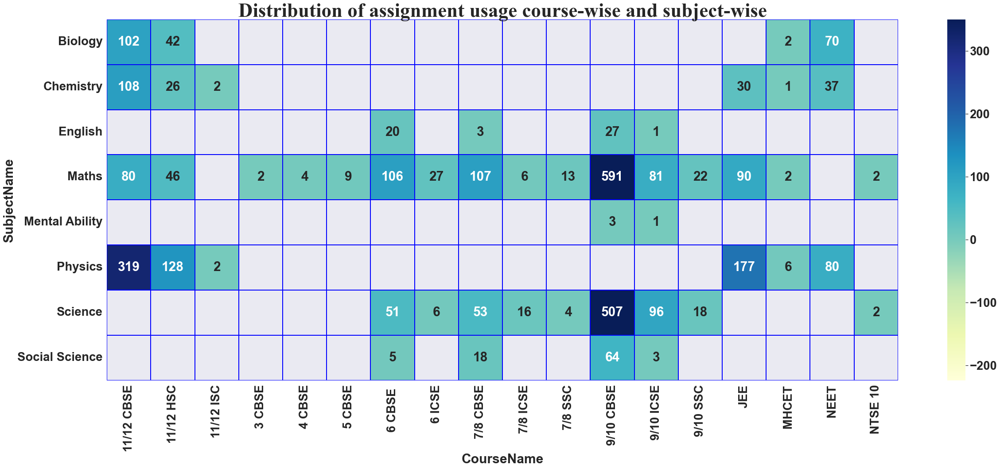

In [18]:
au3 = AU.cwsw_assignment_usage_heatmap()

## Average Assignment session time course-wise subject-wise (Heat Map)

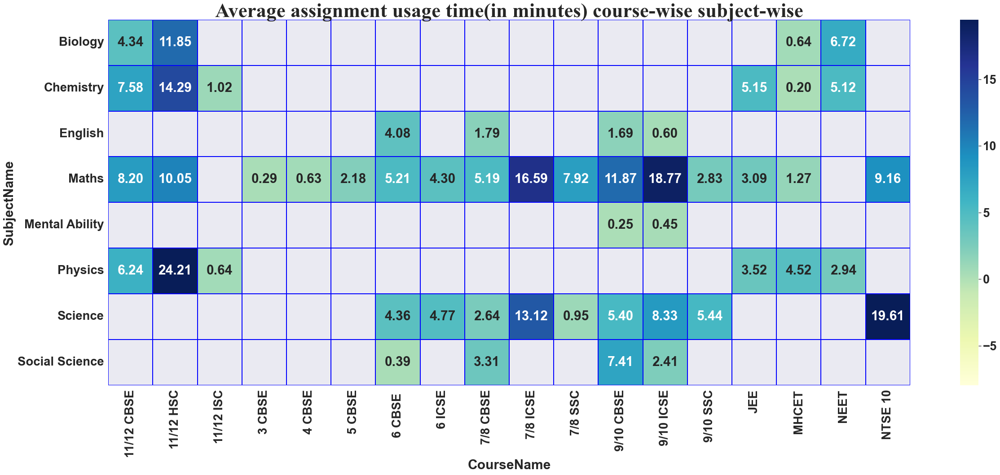

In [19]:
au4 = AU.cwsw_avg_assignment_usage_time_heatmap()

## Number of questions used subject wise and course-wise (Heat Map)

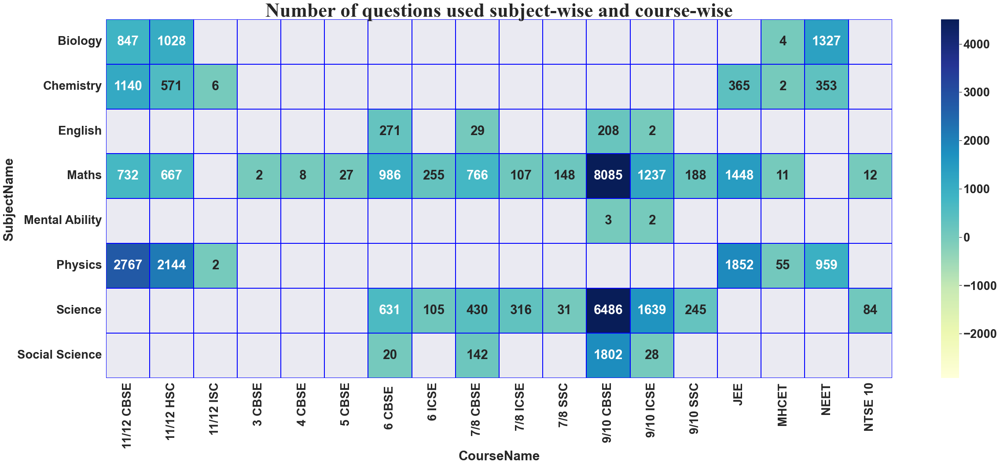

In [20]:
au5 = AU.cwsw_questions_used_heatmap()

## Number of unique questions used subject wise and course-wise (Heat Map)

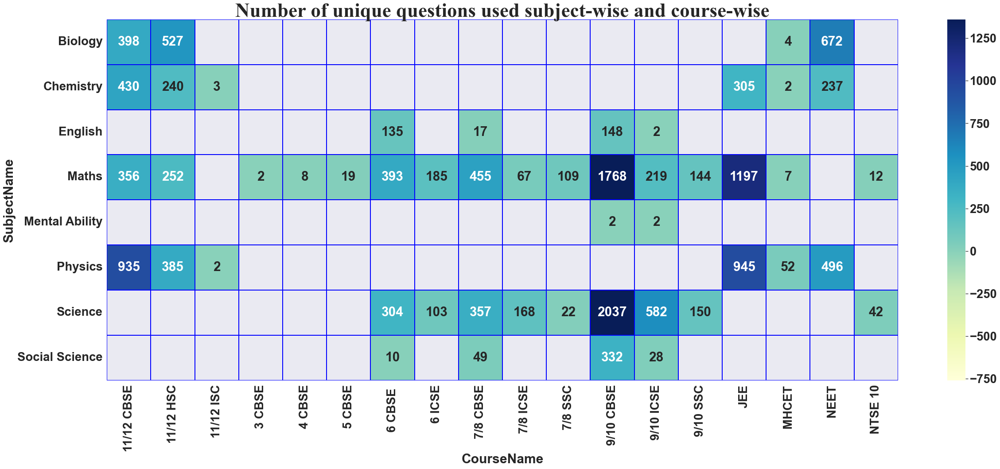

In [21]:
au6 = AU.cwsw_unique_questions_used_heatmap()

## Number of unique users subject-wise and course-wise

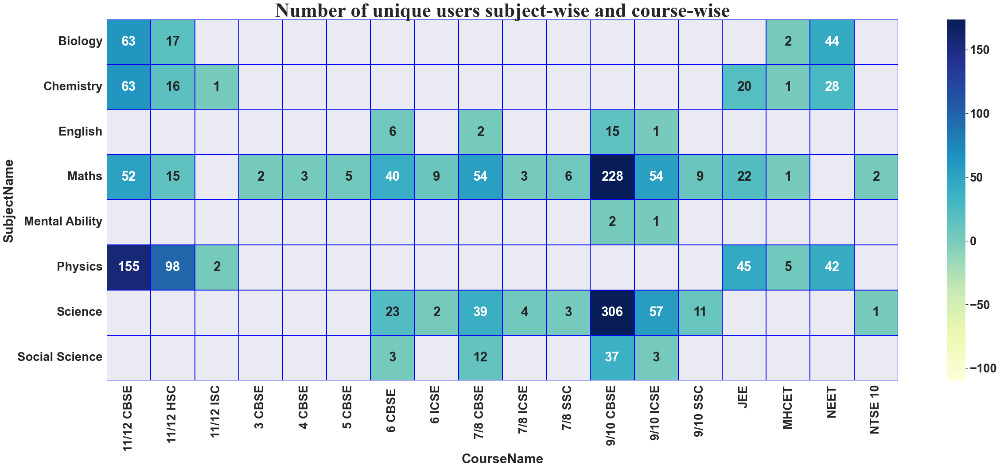

In [22]:
au7 = AU.cwsw_unique_users_heatmap()

## Total time spent course wise & subject wise (Heatmap)

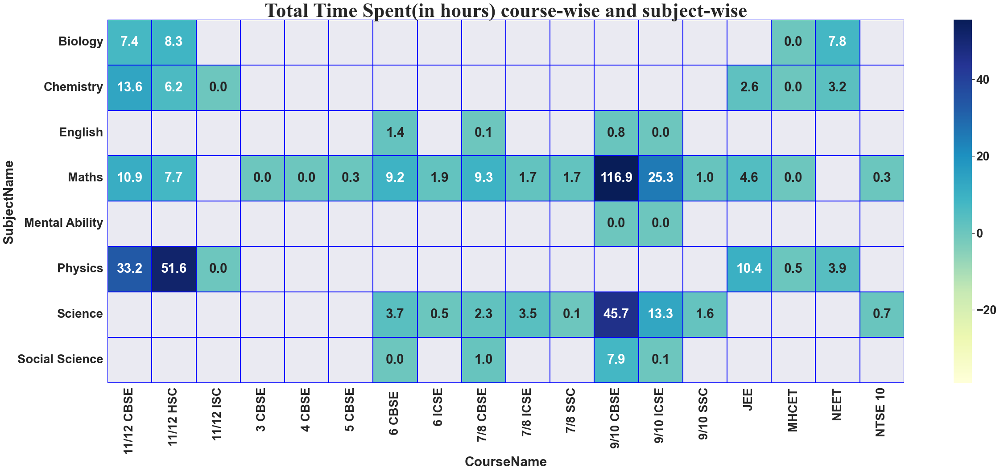

In [23]:
au8 = AU.cwsw_total_time_spent_heatmap()

## Avg no of questions per Assignment session course wise & subject wise (Heatmap)

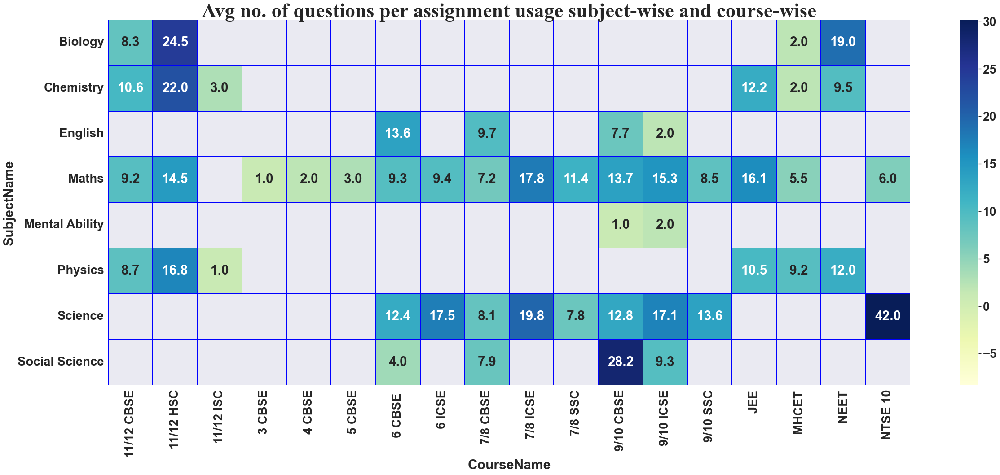

In [24]:
au9 = AU.cwsw_questions_per_assignment_usage_heatmap()

# 2. Self-Test Practice Session Usage(from UserTest tables)
UserTest tables contain the data related to self-tests taken by users

In [25]:
PS = Practice_Session_Usage(conn, start_date, end_date)

Length of data is: 2054206


,index,UserTestSessionId,UserId,QuestionId,IsAttempted,TimeTakenTillSubmission,StartedOn,CompletedOn,AttemptedOn,CourseId,SubjectId,AffiliationCodeId,CenterCodeId,RoleId,CourseName,SubjectName
0,0,552668,132833,29615,1,5,2021-09-01 00:54:36.247,2021-09-01 00:54:45.977,2021-09-01 00:54:41.857,1,1,1814,7772,2,JEE,Physics
1,1,550867,105219,109033,1,3,2021-09-01 00:20:45.297,2021-09-01 00:21:51.633,2021-09-01 00:20:48.413,6,3,903,3366,2,NEET,Chemistry
2,2,553292,131247,23319,1,88,2021-08-31 23:58:32.547,2021-09-01 00:01:38.400,2021-09-01 00:00:00.020,1,2,1752,7191,2,JEE,Maths
3,3,553293,85577,129273,1,241,2021-08-31 23:58:58.667,2021-09-01 00:03:25.363,2021-09-01 00:02:59.503,1,2,18,8314,2,JEE,Maths
4,4,553287,132565,202852,1,138,2021-08-31 23:59:04.033,2021-09-01 00:01:29.327,2021-09-01 00:01:22.947,4,3,1839,7666,2,11/12 CBSE,Chemistry



## Histogram of practice session time

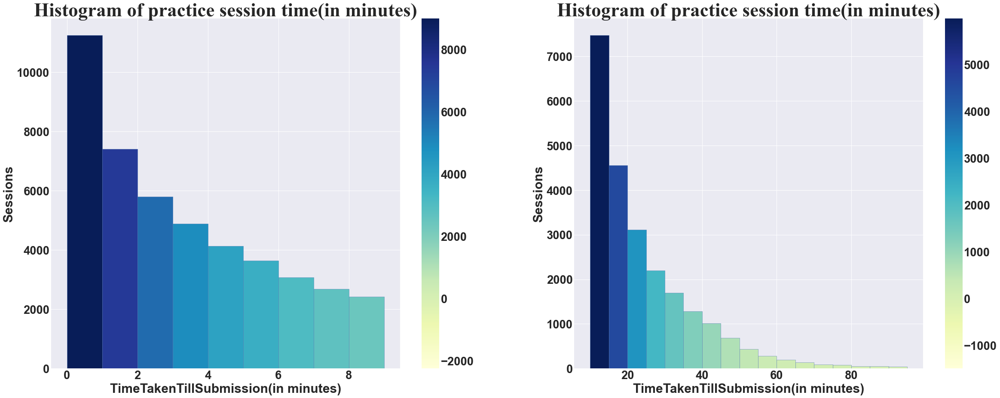

In [26]:
ps1 = PS.practice_session_time_histogram_range_split()

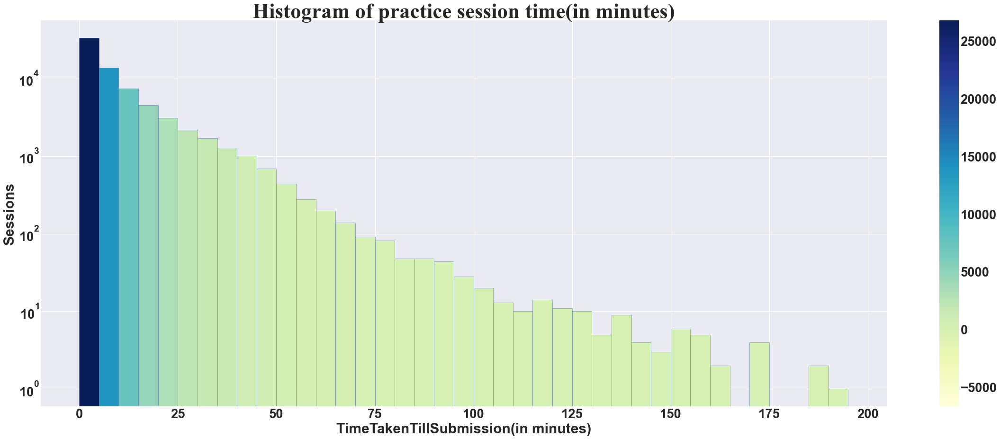

In [27]:
ps2 = PS.practice_session_time_histogram_logscale()

## Distribution of practice sessions course-wise and subject-wise (Heat Map)

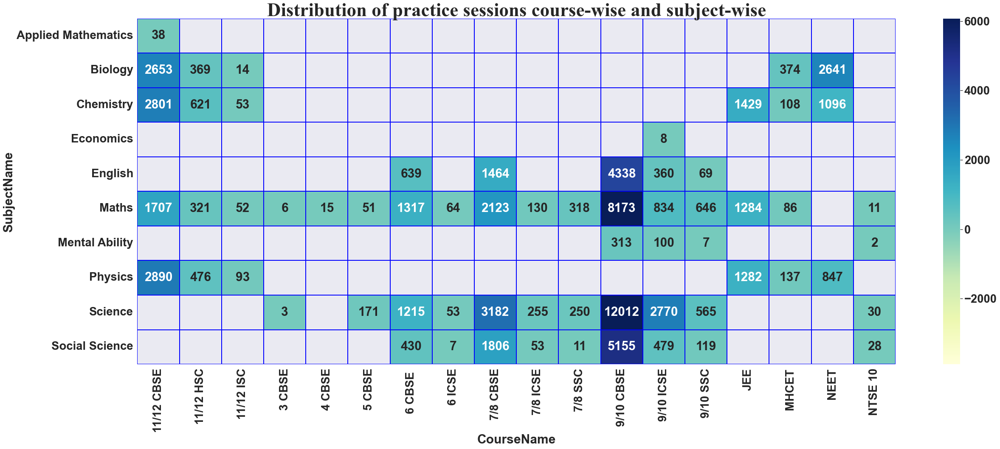

In [28]:
ps3 = PS.cwsw_practice_session_heatmap()

## Average Practice session time course-wise subject-wise (Heat Map)

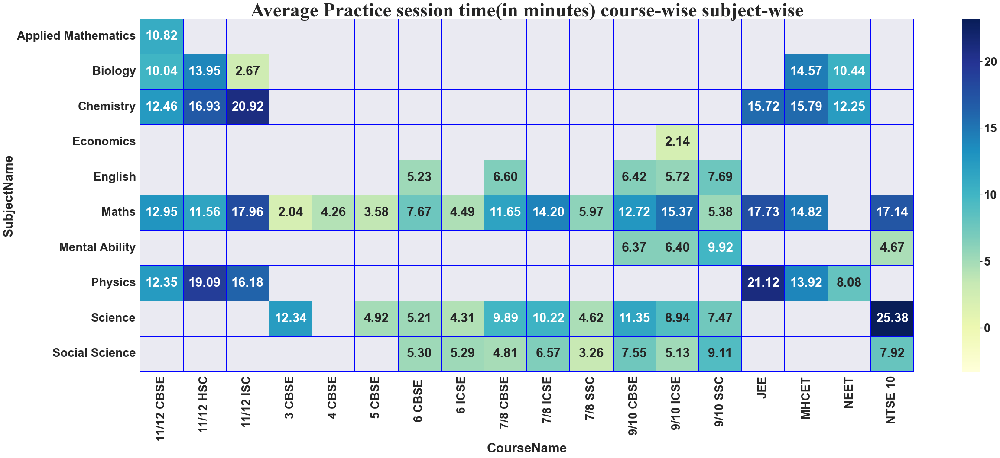

In [29]:
ps4 = PS.cwsw_avg_practice_session_time_heatmap()

## Number of questions used  subject wise and course-wise (Heat Map)

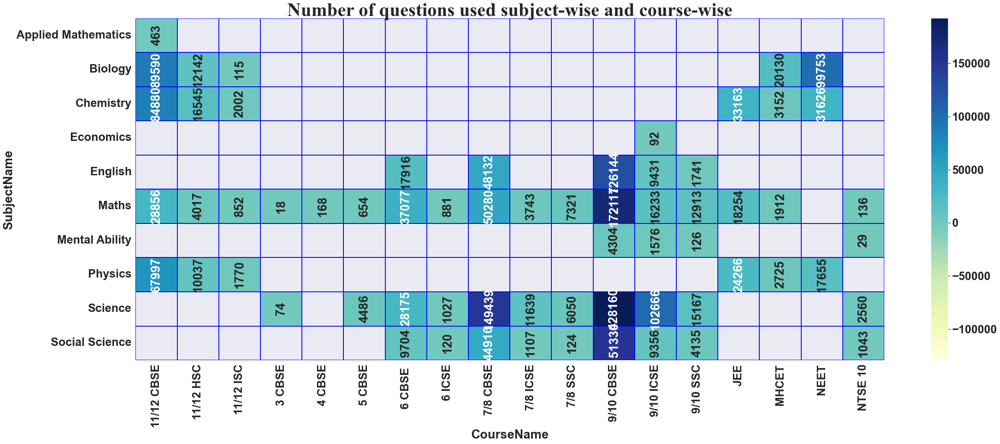

In [30]:
ps5 = PS.cwsw_questions_used_heatmap()

## Number of unique questions used subject wise and course-wise (Heat Map)

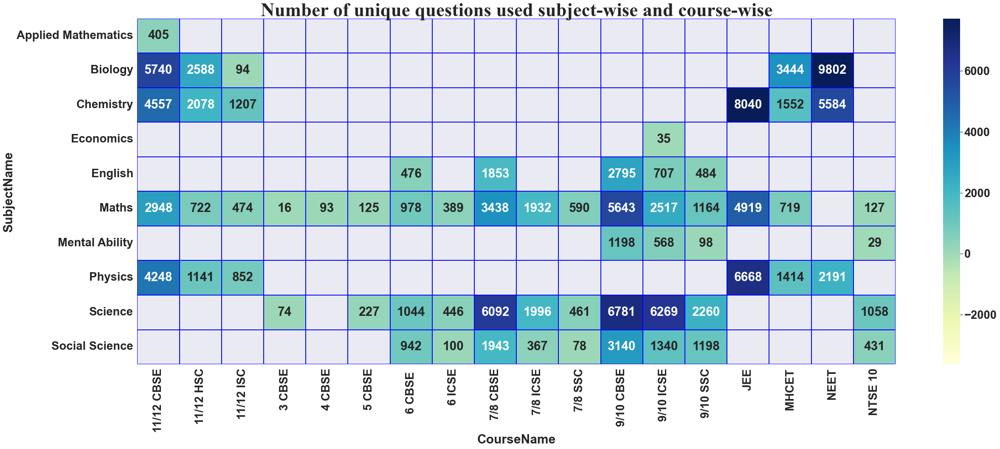

In [31]:
ps6 = PS.cwsw_unique_questions_used_heatmap()

## Number of unique users subject-wise and course-wise

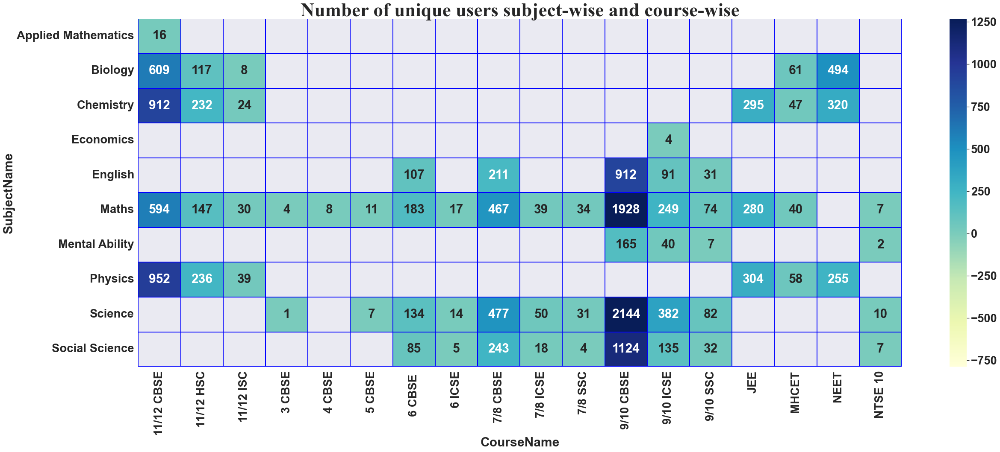

In [32]:
ps7 = PS.cwsw_unique_users_heatmap()

## Total time spent course wise & subject wise (Heatmap) 

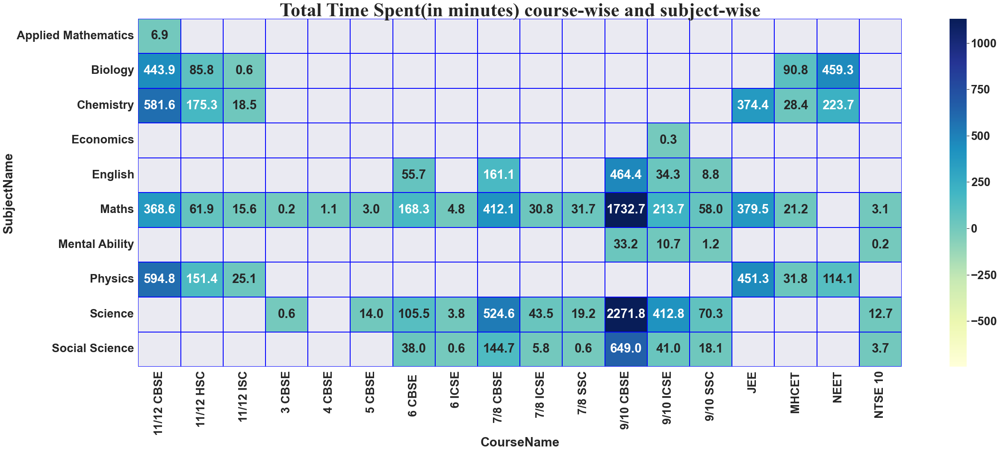

In [33]:
ps8 = PS.cwsw_total_time_spent_heatmap()

## Total time spent course wise & subject wise (Heatmap) 

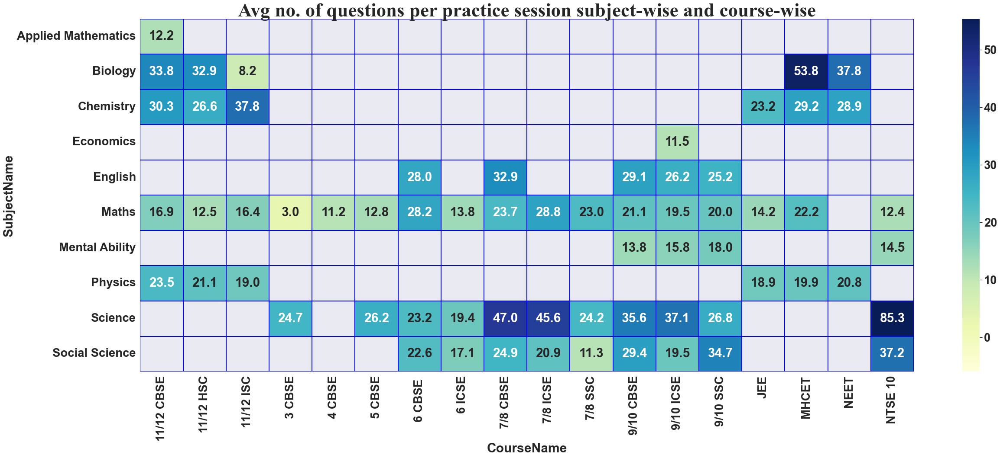

In [34]:
ps9 = PS.cwsw_questions_per_practice_session_heatmap()

# 3. Institute Test Usage

In [35]:
IT = Institute_Test_Usage(conn, start_date, end_date)

Length of data is: 158007


,index,UserId,InstituteTestId,InstituteTestUserId,QuestionId,StartedOn,CompletedOn,TimeTakenInSec,CourseId,AffiliationCodeId,CenterCodeId,RoleId,_SubjectId,CourseName,SubjectName
0,0,87354,15641,1154290,751,2021-09-12 15:22:58.863,2021-09-12 15:27:35.130,276,1,1125,4287,2,1,JEE,Physics
1,1,135952,16386,1195459,751,2021-09-19 14:37:46.950,2021-09-19 14:39:29.487,103,1,1748,7135,2,1,JEE,Physics
2,2,95502,15016,1134000,1317,2021-09-05 20:56:29.280,2021-09-05 20:57:38.573,69,1,1292,5209,2,2,JEE,Maths
3,3,94505,15607,1152510,1328,2021-09-11 16:46:47.927,2021-09-11 16:55:41.590,534,1,1292,5209,2,2,JEE,Maths
4,4,113508,15106,1136925,1592,2021-09-07 20:31:01.563,2021-09-07 21:07:02.373,121,6,1635,6536,2,1,NEET,Physics


## Course-wise test analysis

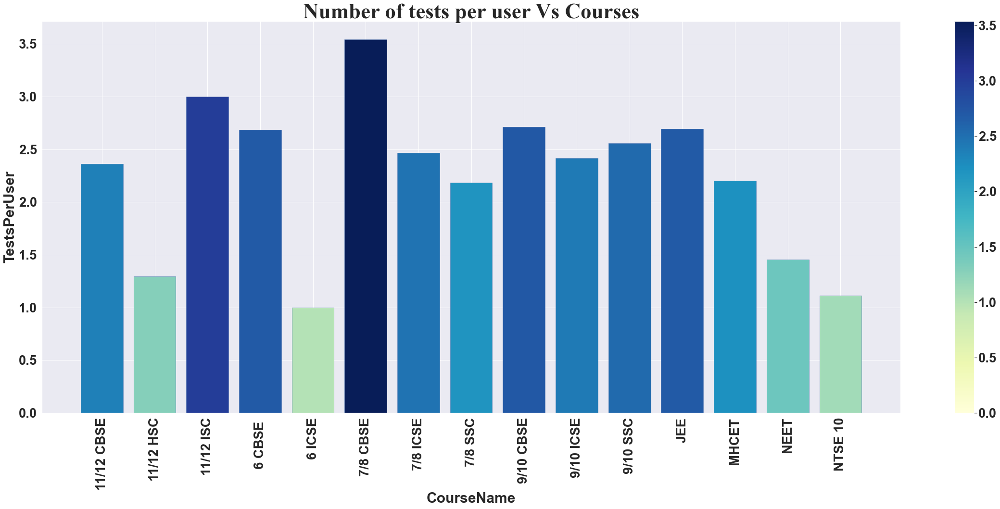

In [36]:
it1 = IT.coursewise_analysis_1()

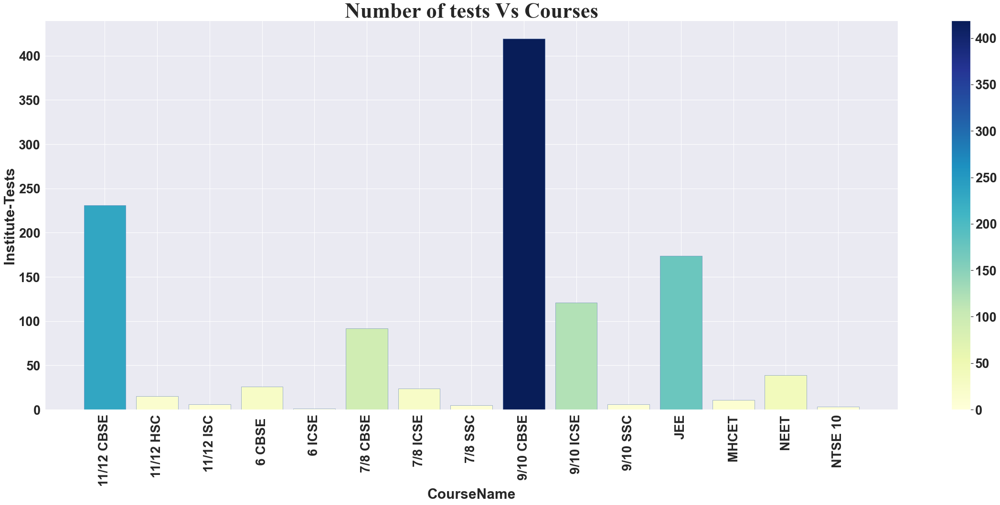

In [37]:
it2 = IT.coursewise_analysis_2()

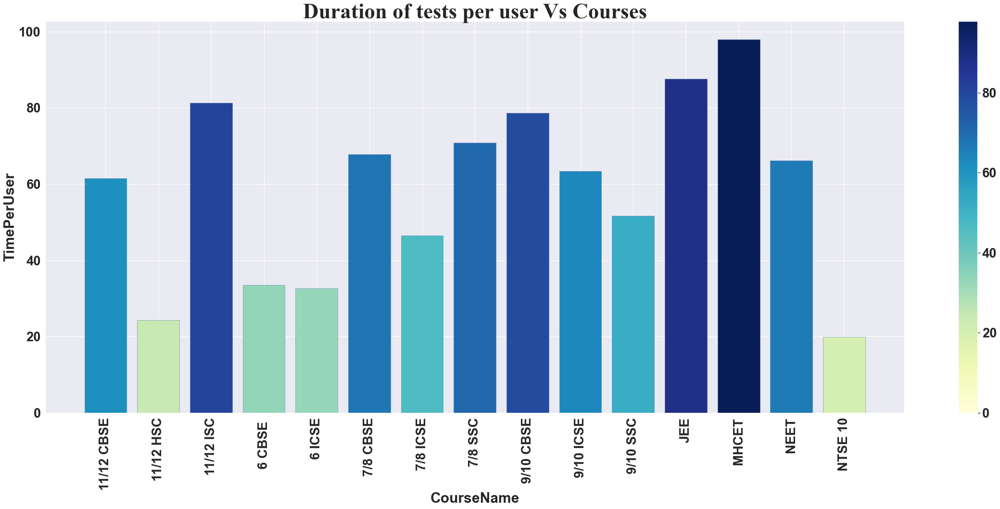

In [38]:
it3 = IT.coursewise_analysis_3()

## Subject-wise test analysis

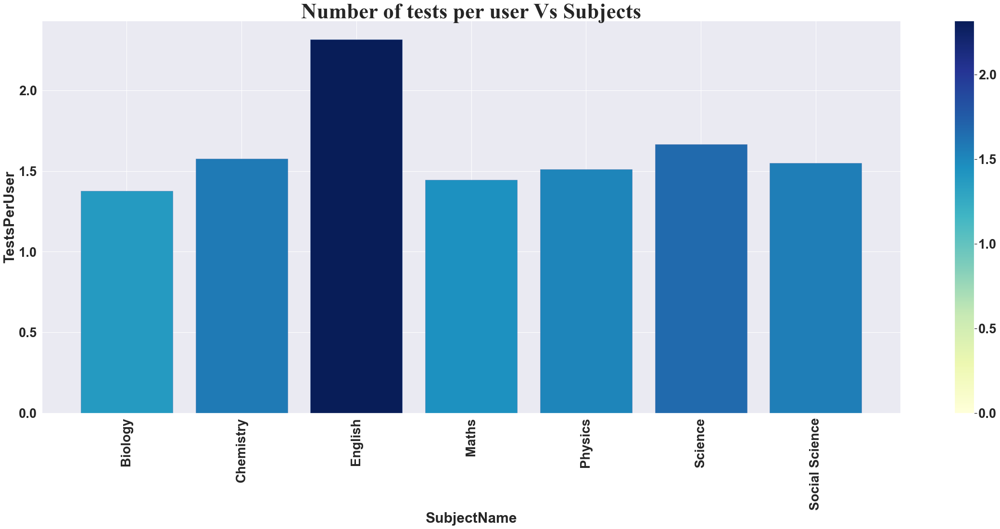

In [39]:
it4 = IT.subjectwise_analysis_1()

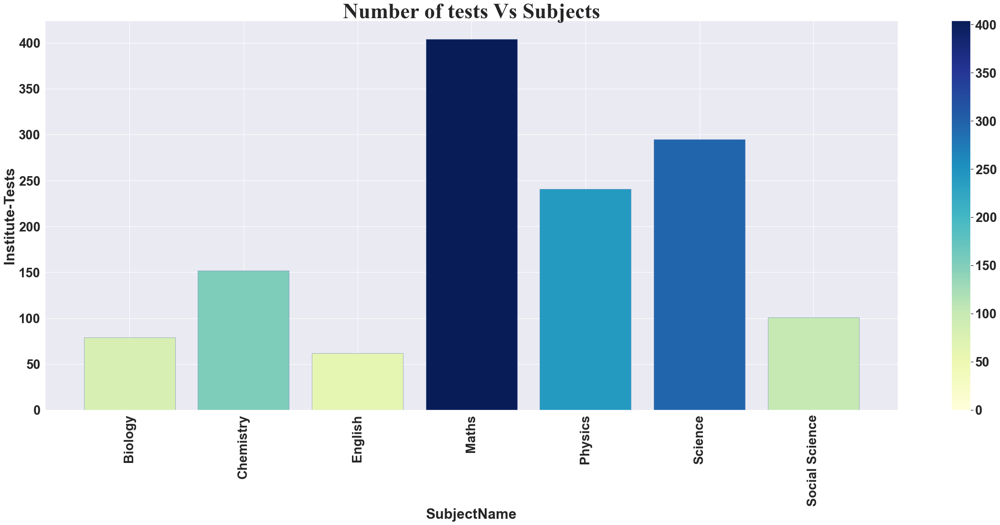

In [40]:
it5 = IT.subjectwise_analysis_2()

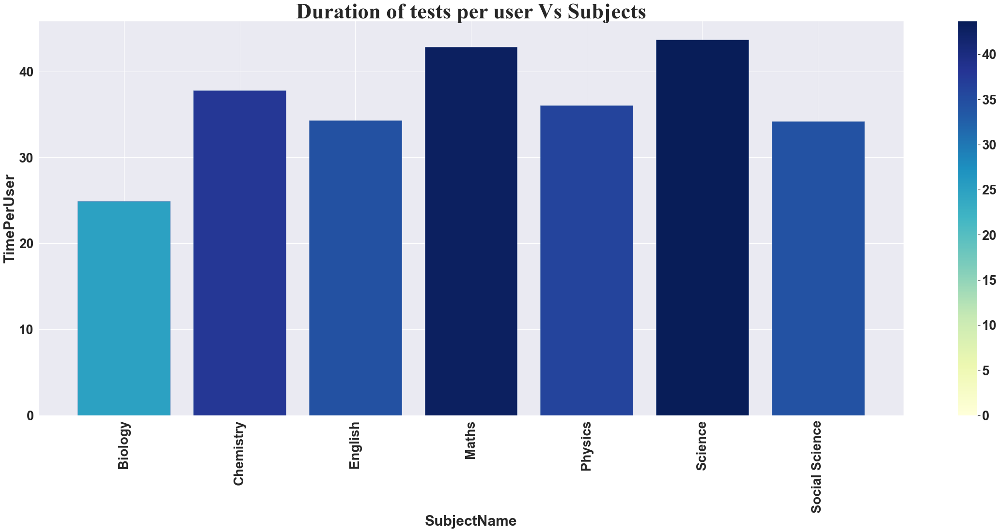

In [41]:
it6 = IT.subjectwise_analysis_3()

## Affiliation-wise test analysis

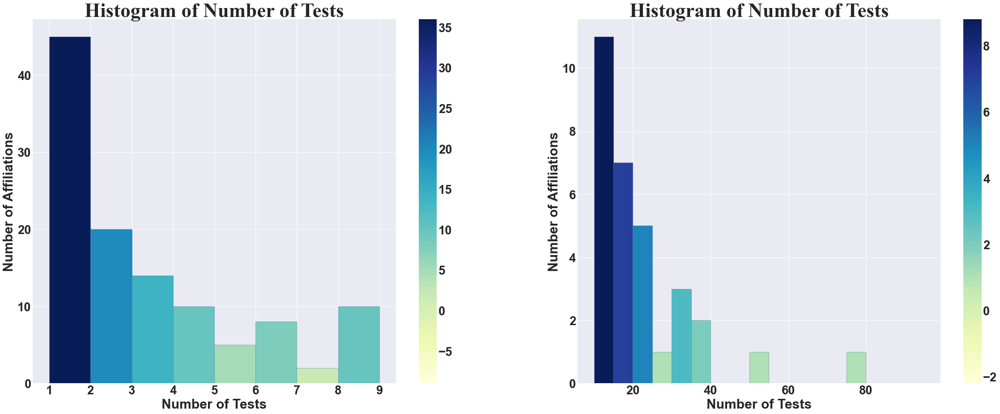

In [42]:
it7 = IT.affiliationwise_analysis()

## Daily Trend

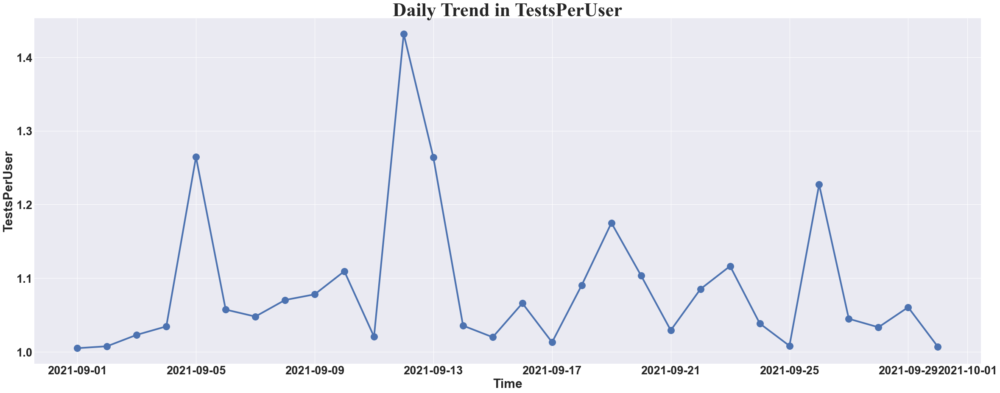

In [43]:
it8 = IT.daily_trend_1()

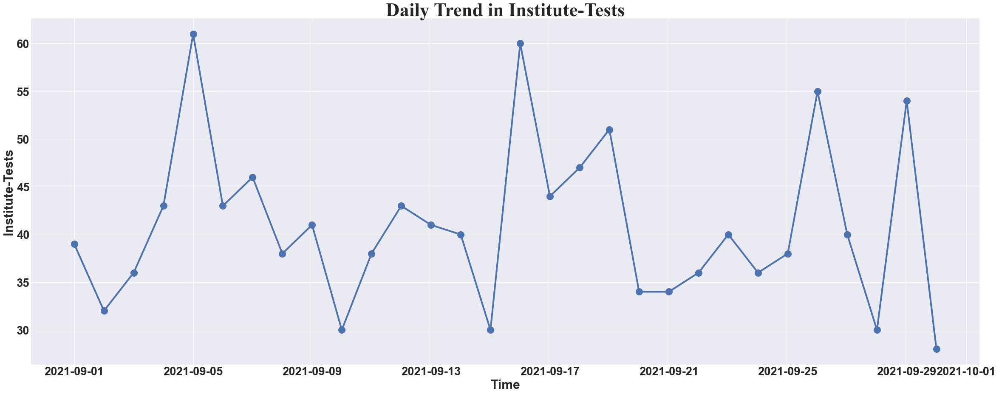

In [44]:
it9 = IT.daily_trend_2()

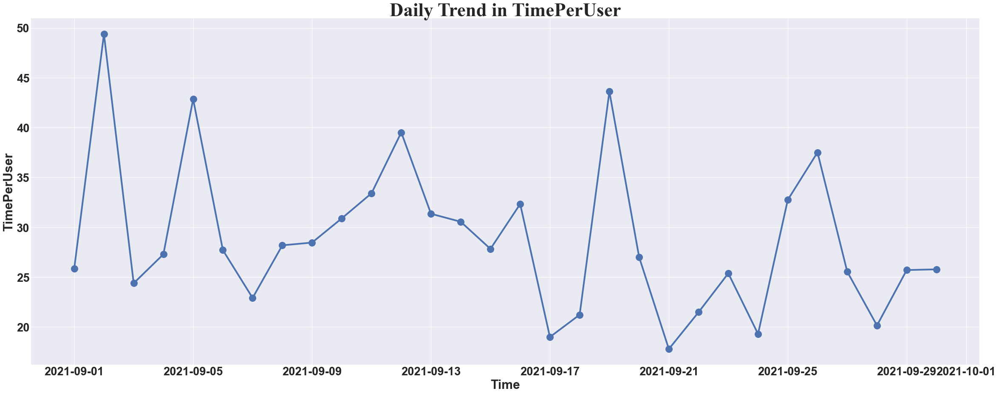

In [45]:
it10 = IT.daily_trend_3()

## Weekly Trend

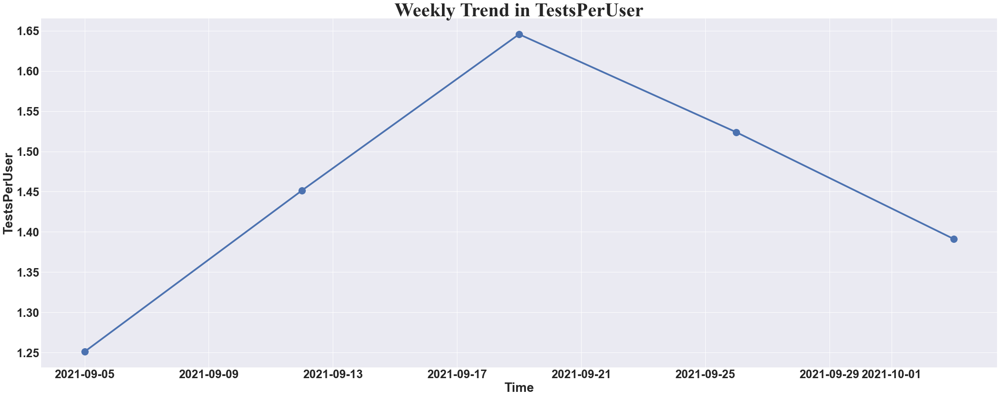

In [46]:
it11 = IT.weekly_trend_1()

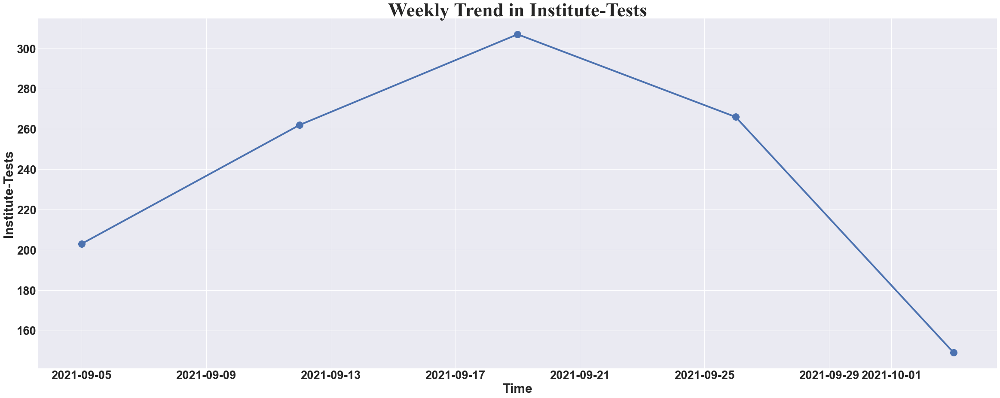

In [47]:
it12 = IT.weekly_trend_2()

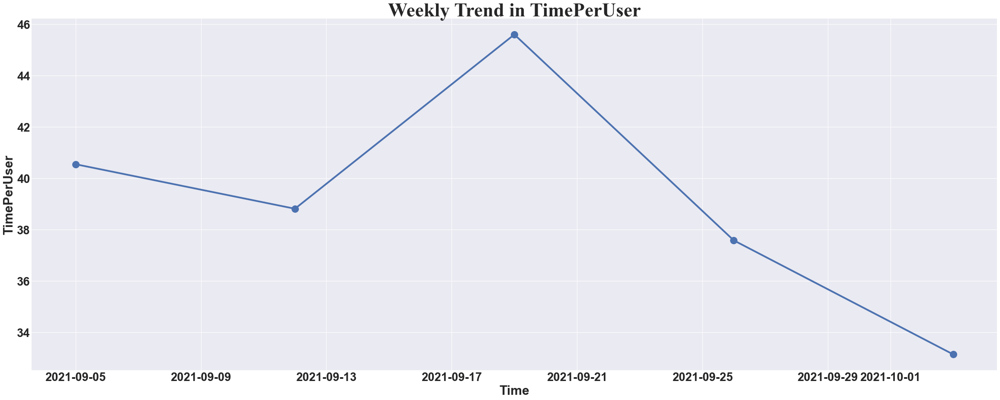

In [48]:
it13 = IT.weekly_trend_3()

## Monthly Trend

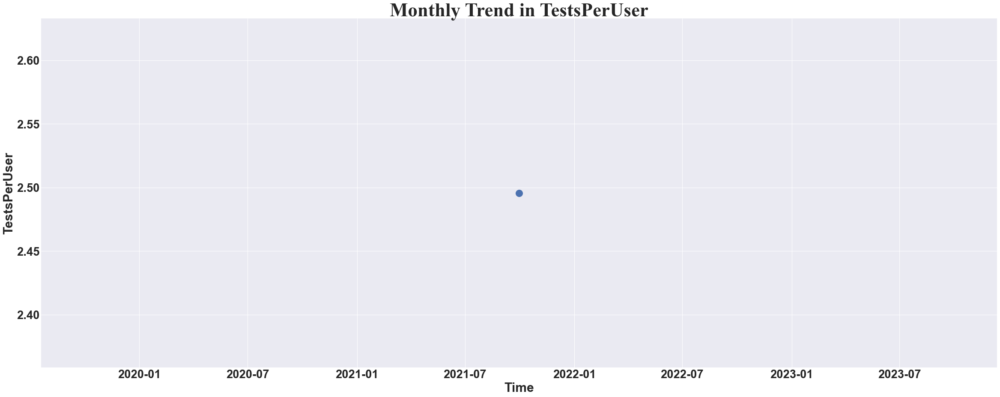

In [49]:
it14 = IT.monthly_trend_1()

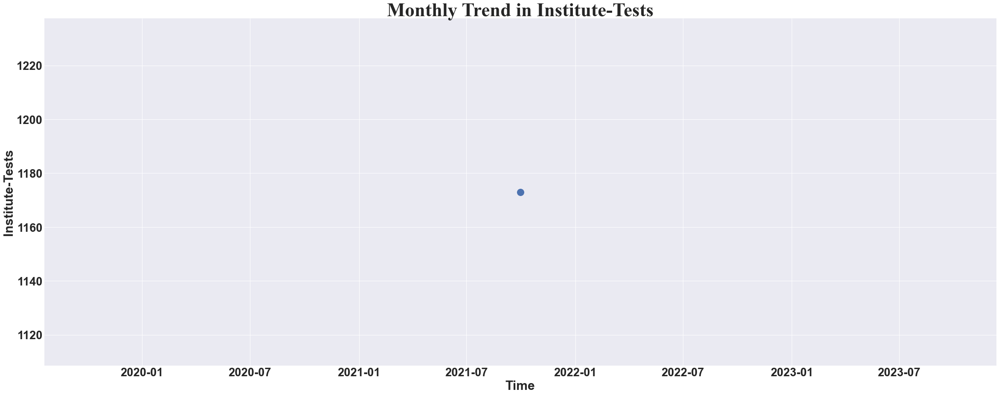

In [50]:
it15 = IT.monthly_trend_2()

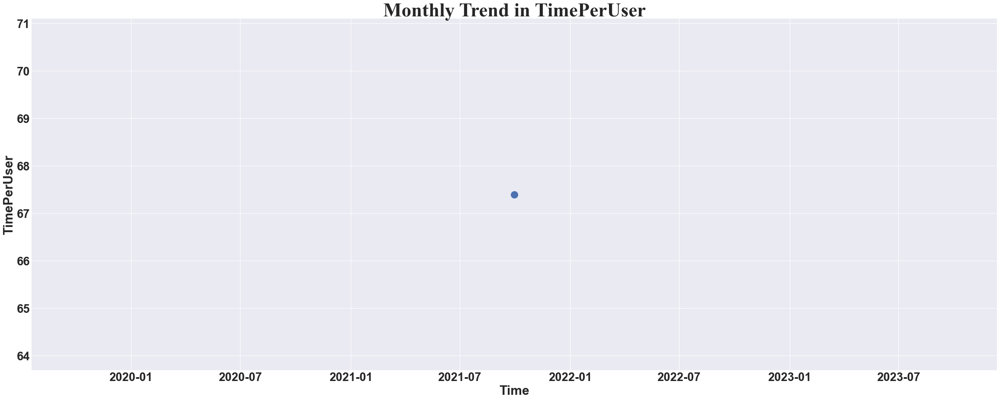

In [51]:
it16 = IT.monthly_trend_3()

## Quarterly Trend

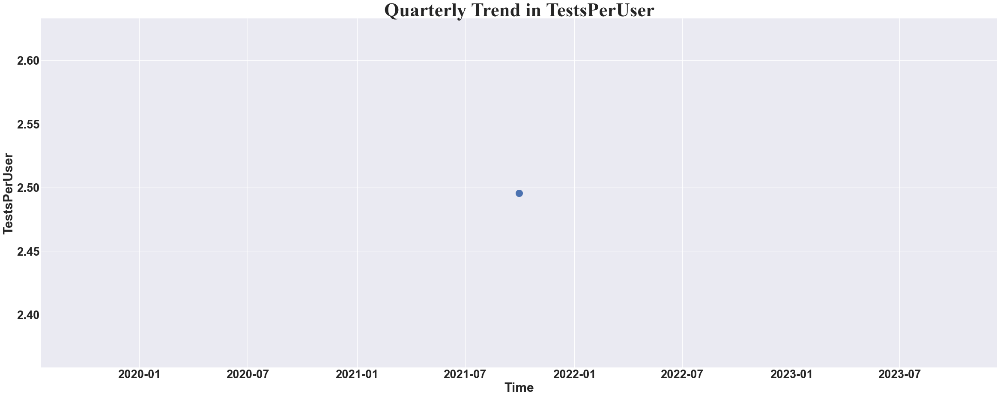

In [52]:
it17 = IT.quarterly_trend_1()

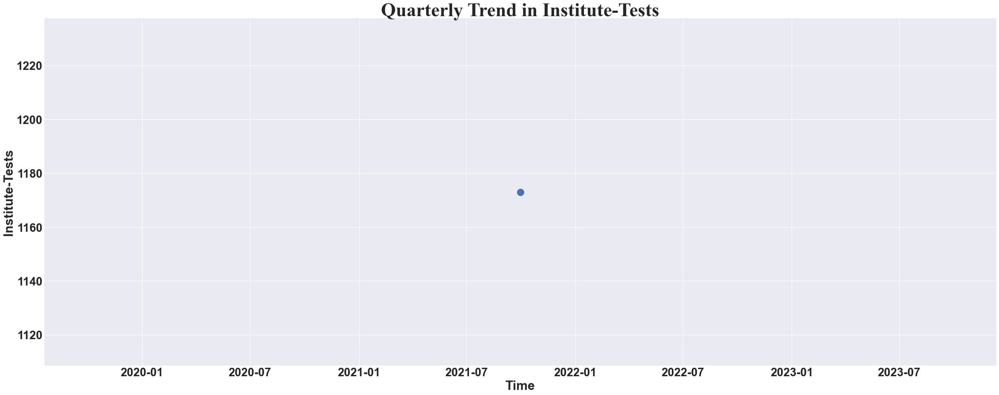

In [53]:
it18 = IT.quarterly_trend_2()

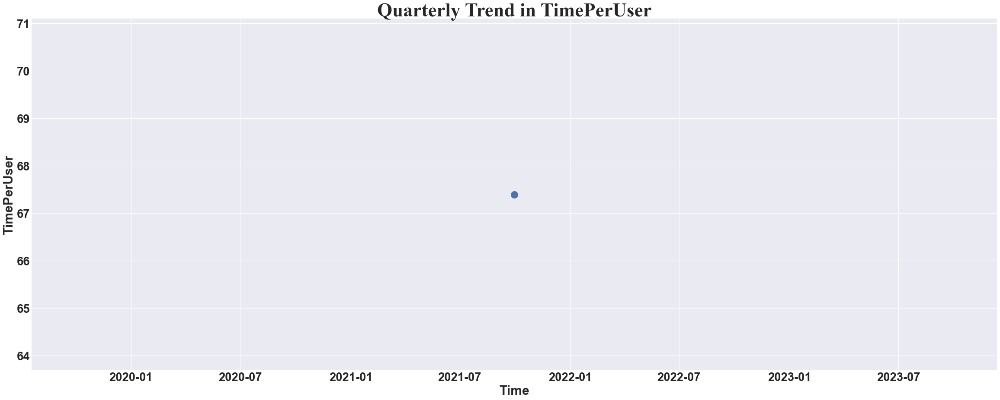

In [54]:
it19 = IT.quarterly_trend_3()

## Yearly Trend

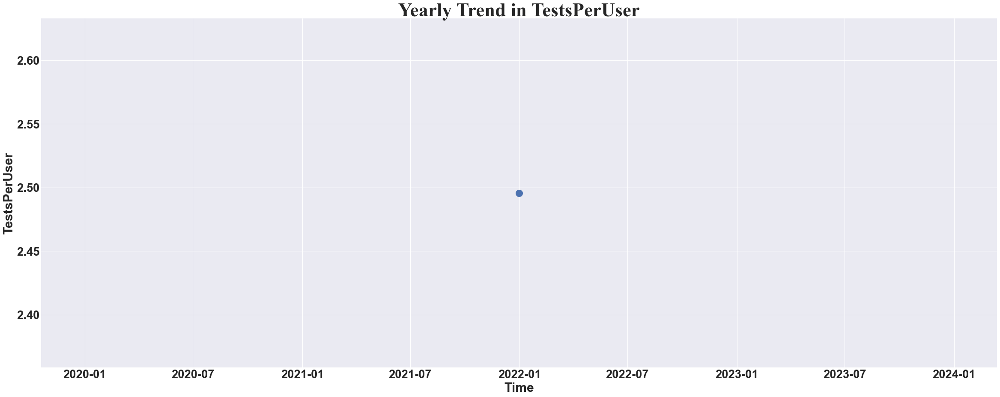

In [55]:
it20 = IT.yearly_trend_1()

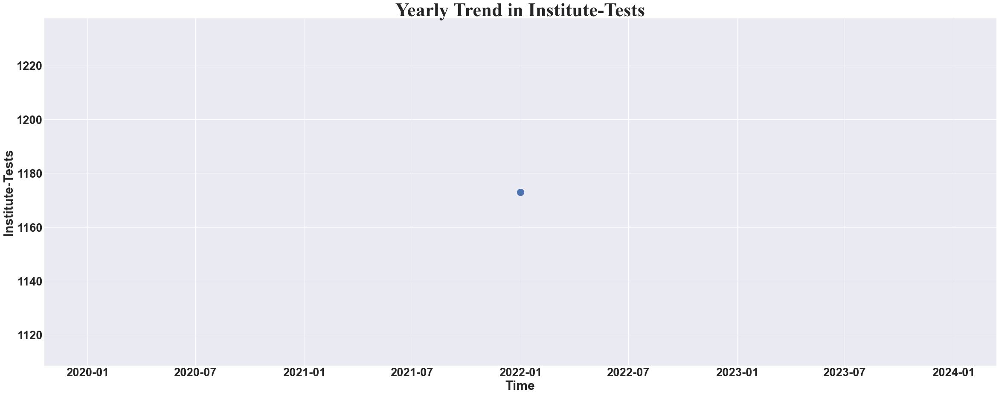

In [56]:
it21 = IT.yearly_trend_2()

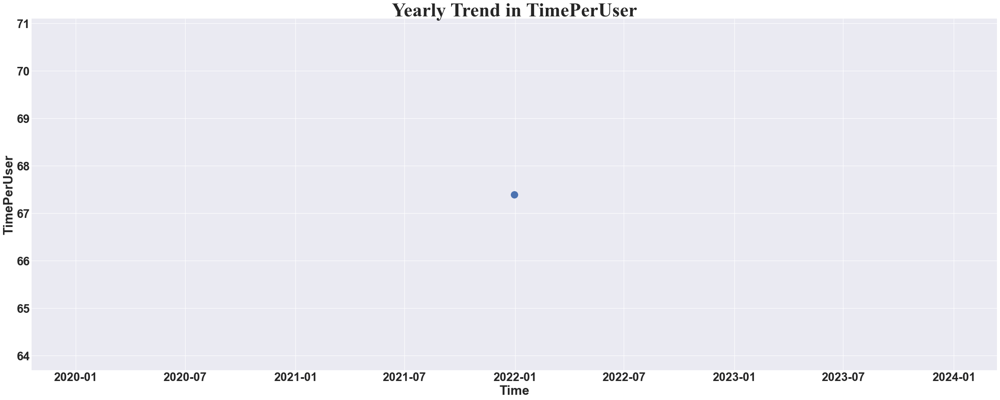

In [57]:
it22 = IT.yearly_trend_3()

# 4. Self Test Usage

In [58]:
ST = Self_Test_Usage(conn, start_date, end_date)

Length of data is: 2054206


,index,UserTestSessionId,UserId,QuestionId,IsAttempted,TimeTakenTillSubmission,StartedOn,CompletedOn,AttemptedOn,CourseId,SubjectId,AffiliationCodeId,CenterCodeId,RoleId,CourseName,SubjectName
0,0,552668,132833,29615,1,5,2021-09-01 00:54:36.247,2021-09-01 00:54:45.977,2021-09-01 00:54:41.857,1,1,1814,7772,2,JEE,Physics
1,1,550867,105219,109033,1,3,2021-09-01 00:20:45.297,2021-09-01 00:21:51.633,2021-09-01 00:20:48.413,6,3,903,3366,2,NEET,Chemistry
2,2,553292,131247,23319,1,88,2021-08-31 23:58:32.547,2021-09-01 00:01:38.400,2021-09-01 00:00:00.020,1,2,1752,7191,2,JEE,Maths
3,3,553293,85577,129273,1,241,2021-08-31 23:58:58.667,2021-09-01 00:03:25.363,2021-09-01 00:02:59.503,1,2,18,8314,2,JEE,Maths
4,4,553287,132565,202852,1,138,2021-08-31 23:59:04.033,2021-09-01 00:01:29.327,2021-09-01 00:01:22.947,4,3,1839,7666,2,11/12 CBSE,Chemistry


## Course-wise test analysis

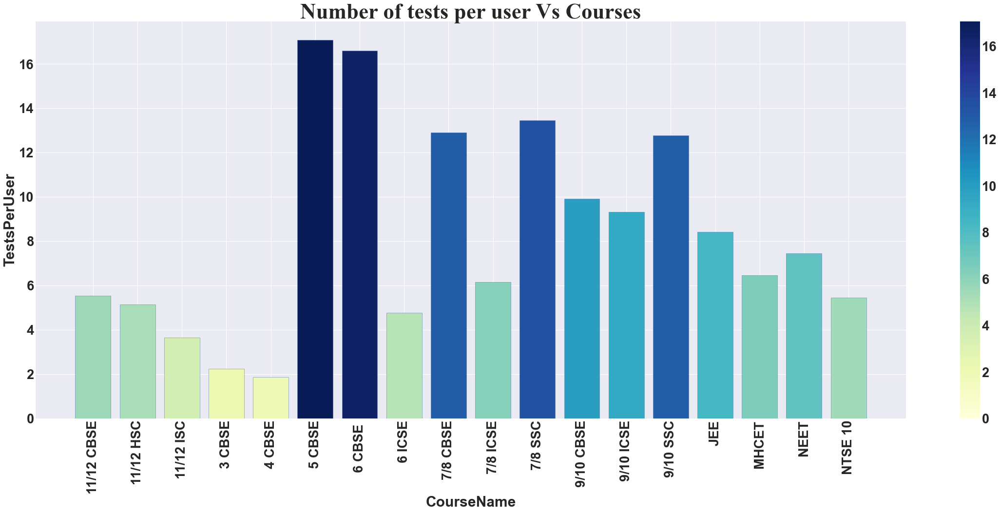

In [59]:
st1 = ST.coursewise_analysis_1()

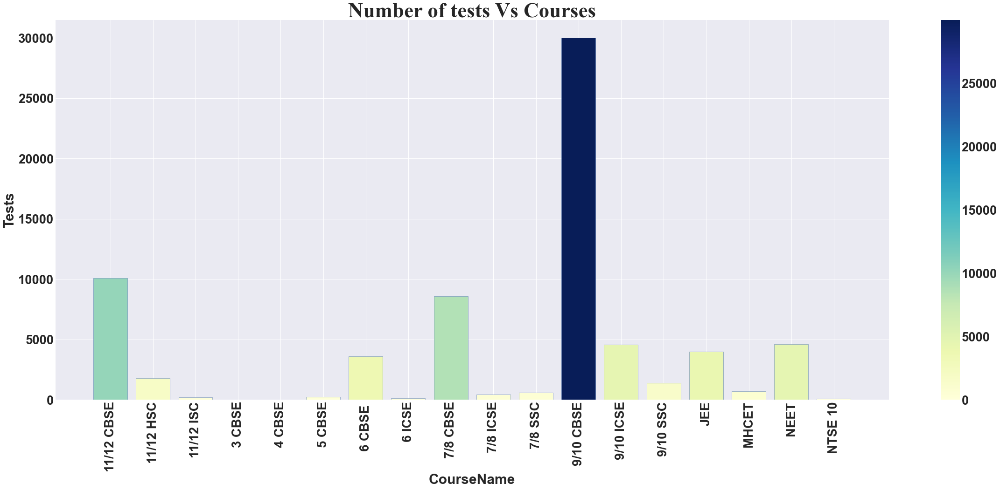

In [60]:
st2 = ST.coursewise_analysis_2()

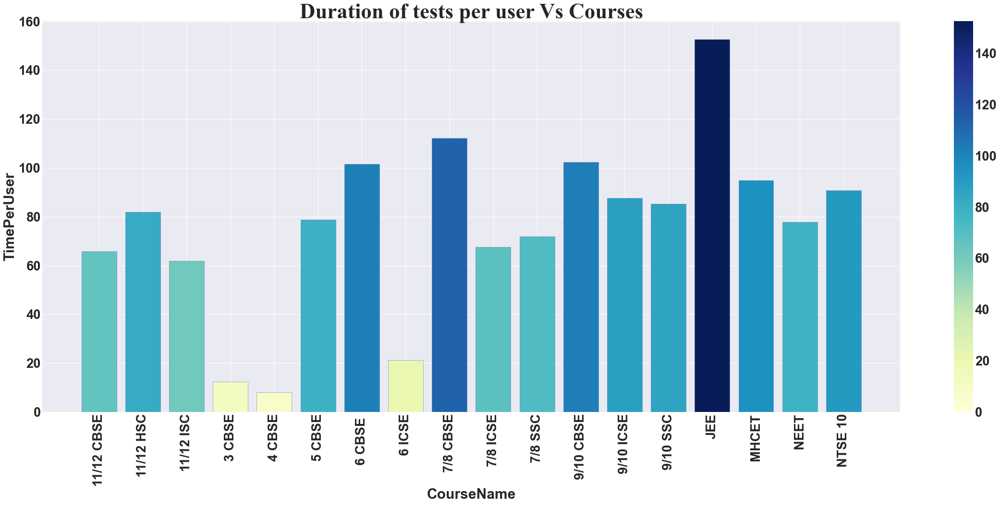

In [61]:
st3 = ST.coursewise_analysis_3()

## Subject-wise test analysis

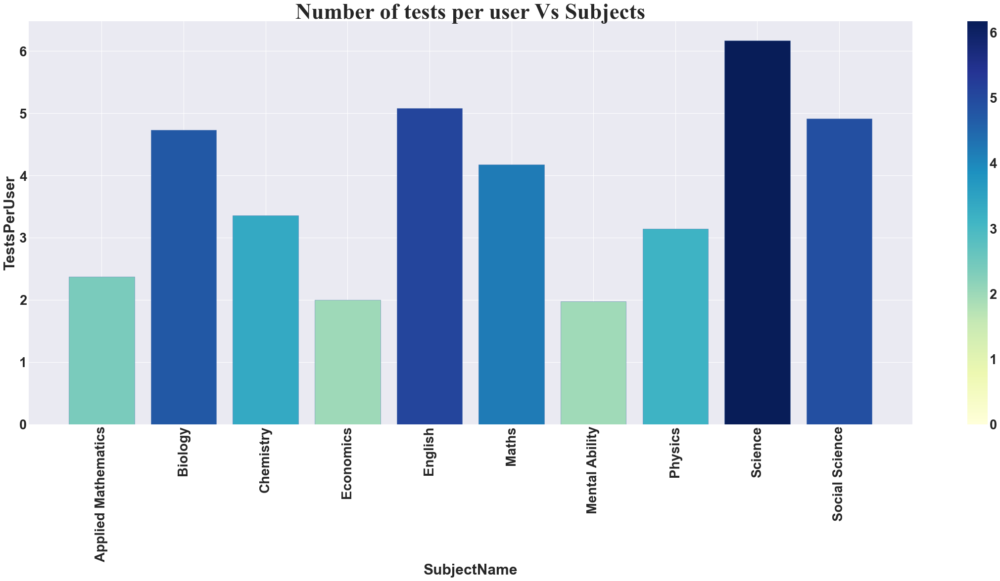

In [62]:
st4 = ST.subjectwise_analysis_1()

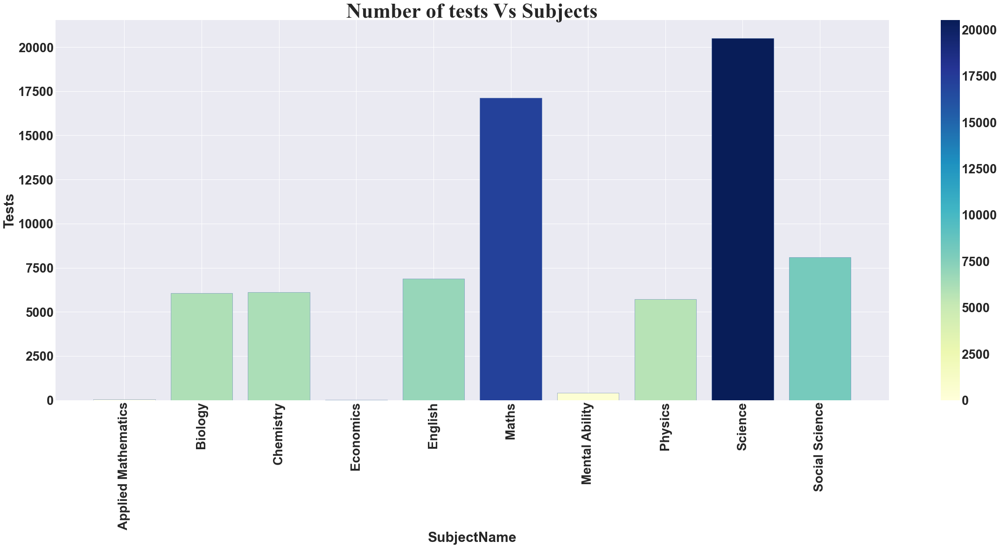

In [63]:
st5 = ST.subjectwise_analysis_2()

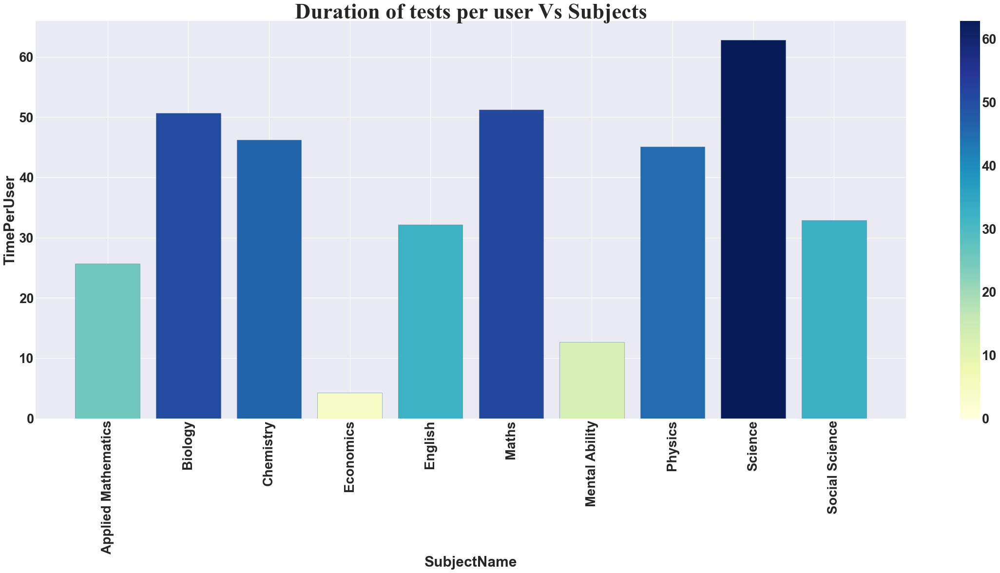

In [64]:
st6 = ST.subjectwise_analysis_3()

## Affiliation-wise test analysis

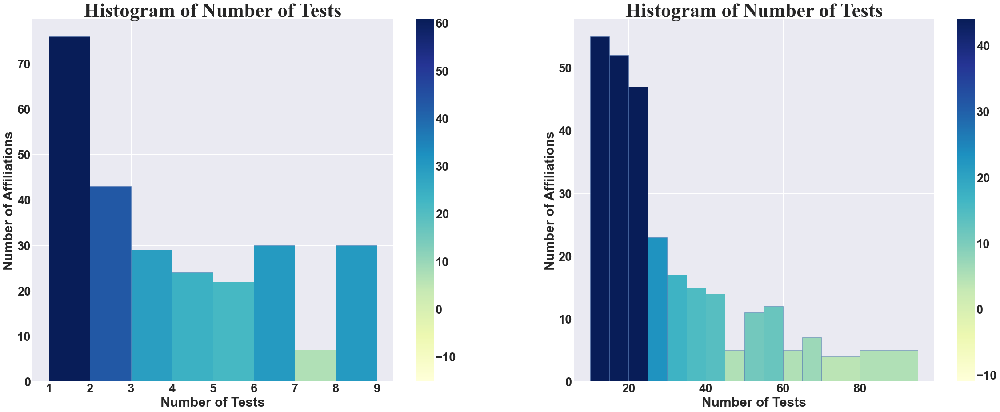

In [65]:
st7 = ST.affiliationwise_analysis()

## Daily Trend

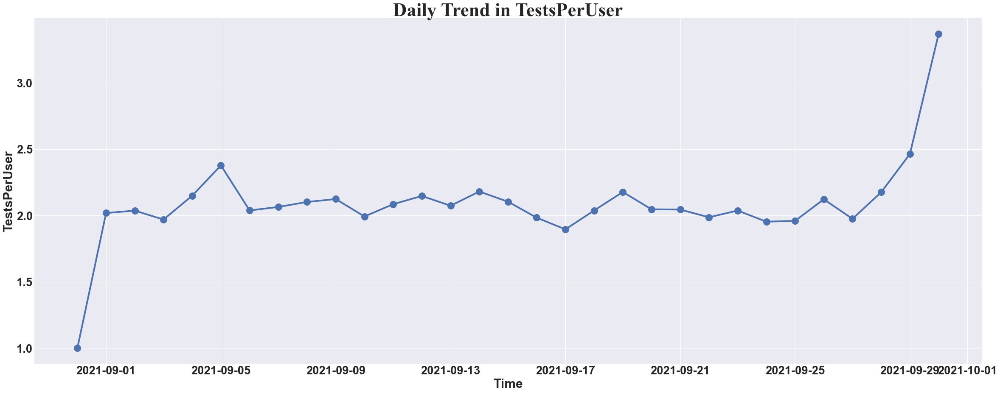

In [66]:
st8 = ST.daily_trend_1()

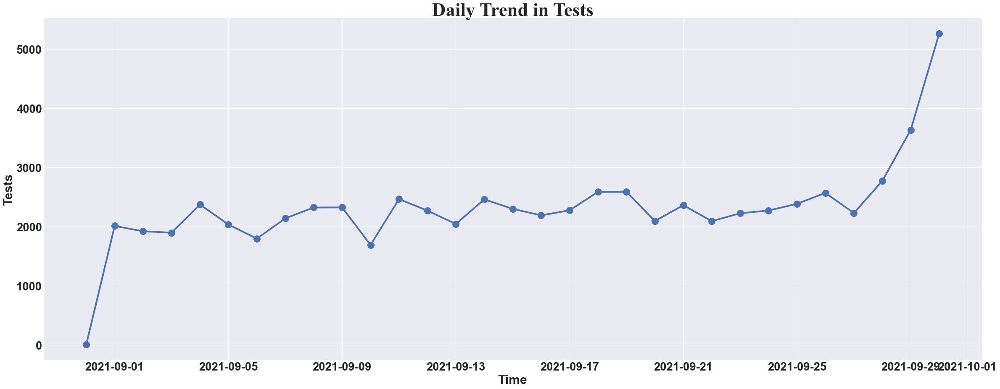

In [67]:
st9 = ST.daily_trend_2()

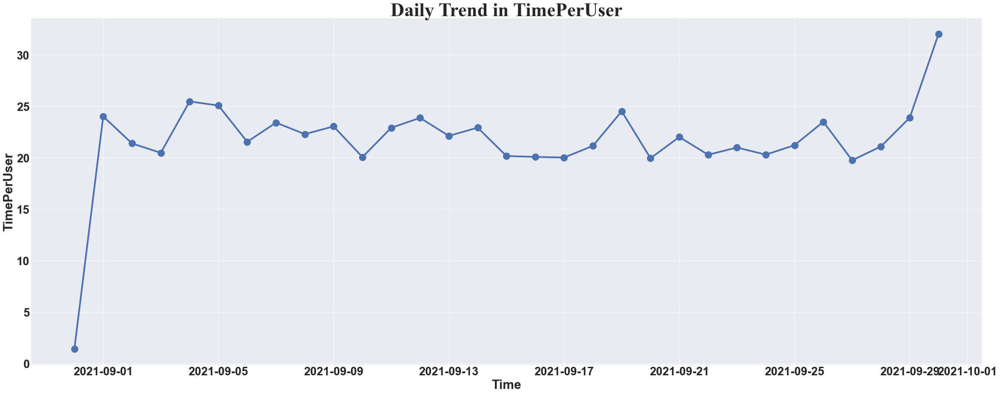

In [68]:
st10 = ST.daily_trend_3()

## Weekly Trend

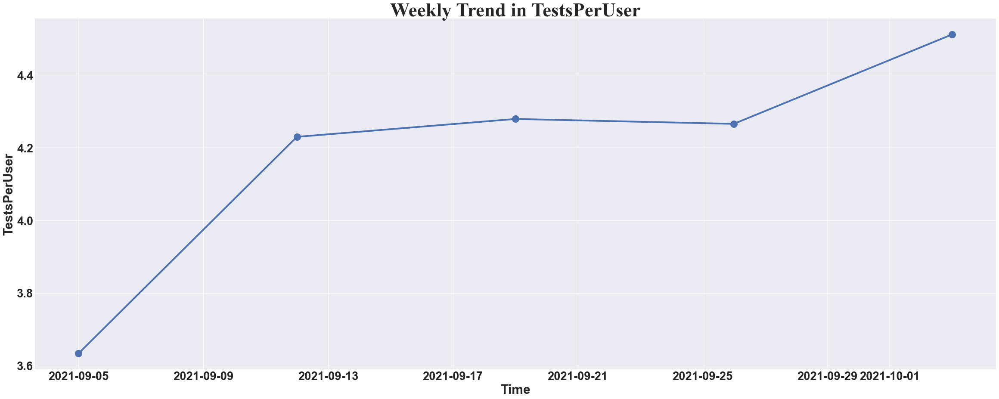

In [69]:
st11 = ST.weekly_trend_1()

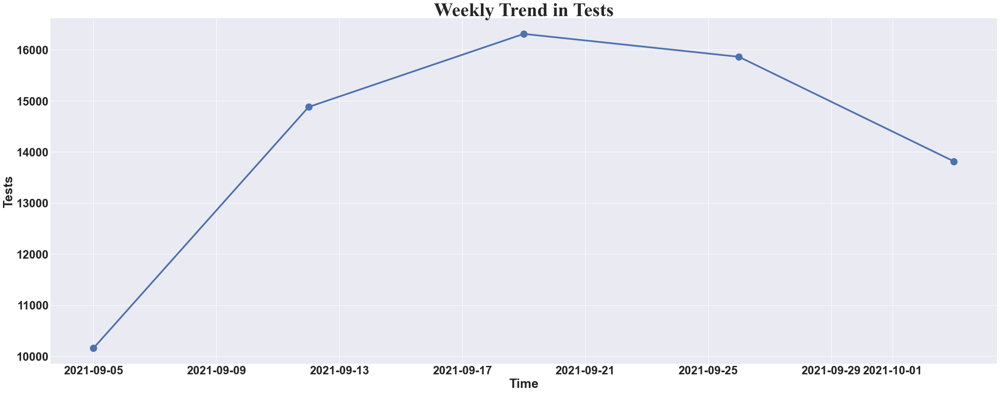

In [70]:
st12 = ST.weekly_trend_2()

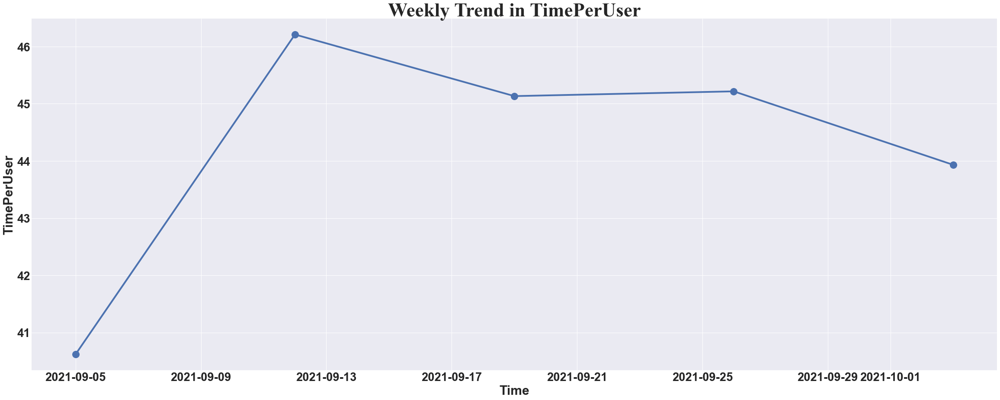

In [71]:
st13 = ST.weekly_trend_3()

## Monthly Trend

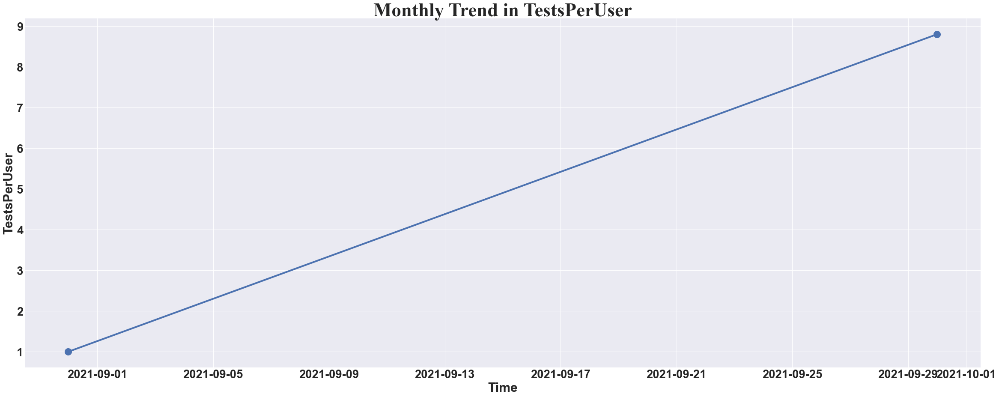

In [72]:
st14 = ST.monthly_trend_1()

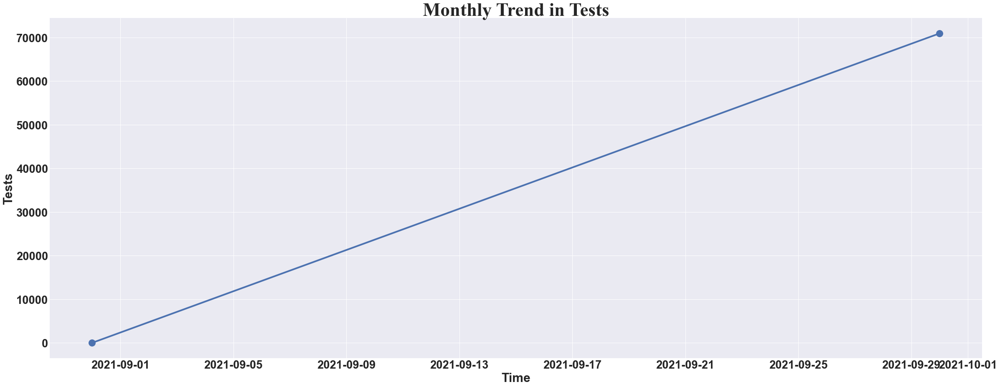

In [73]:
st15 = ST.monthly_trend_2()

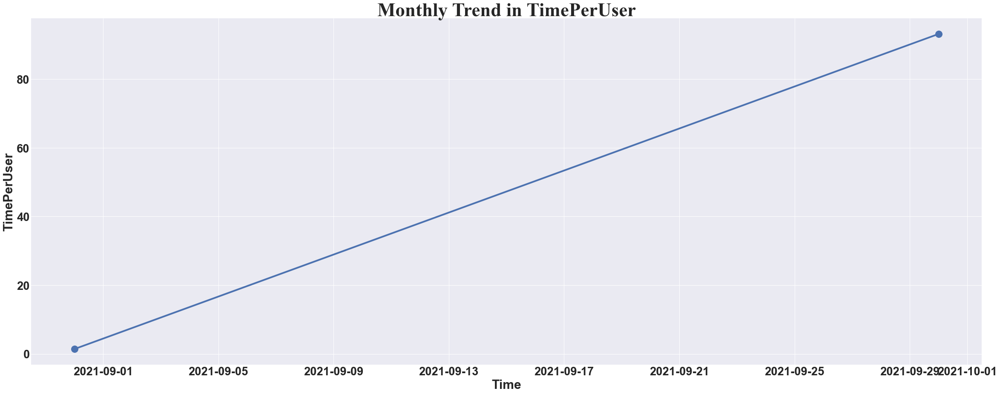

In [74]:
st16 = ST.monthly_trend_3()

## Quarterly Trend

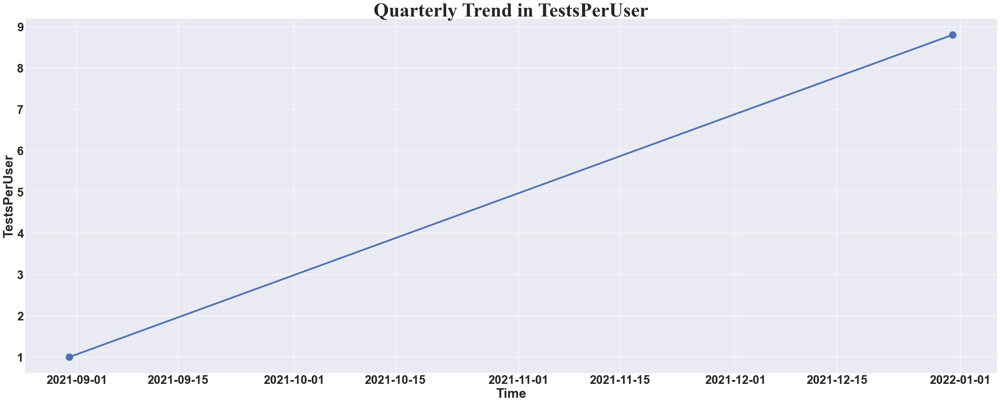

In [75]:
st17 = ST.quarterly_trend_1()

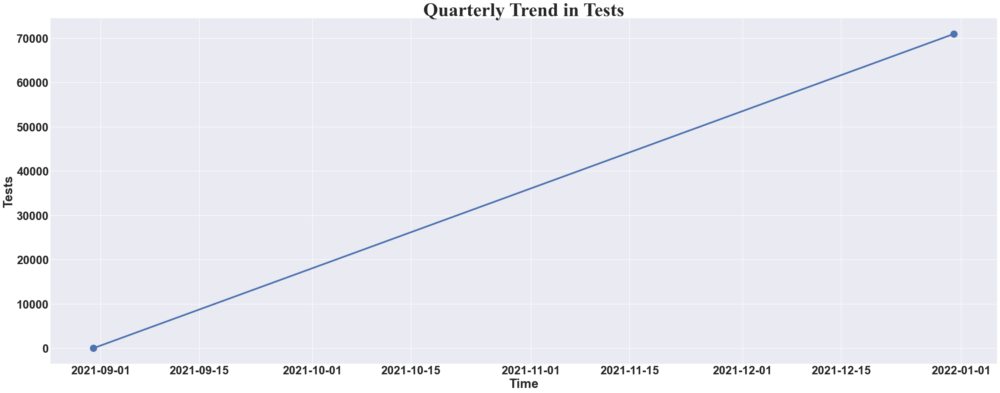

In [76]:
st18 = ST.quarterly_trend_2()

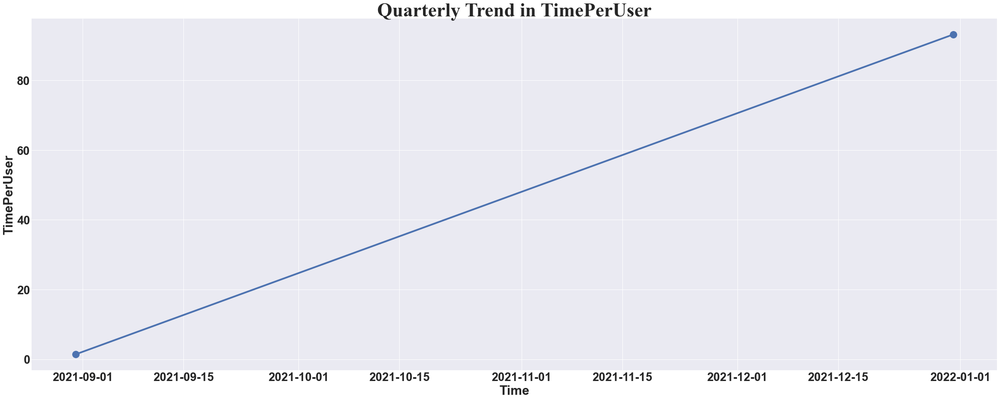

In [77]:
st19 = ST.quarterly_trend_3()

## Yearly Trend

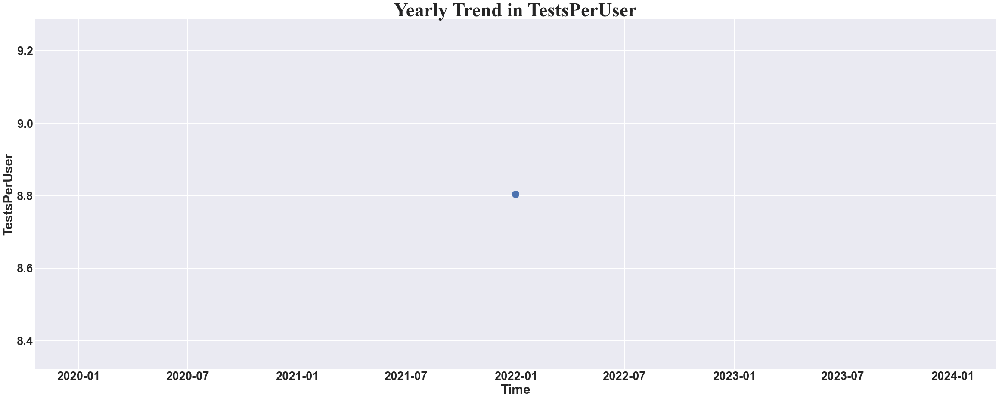

In [78]:
st20 = ST.yearly_trend_1()

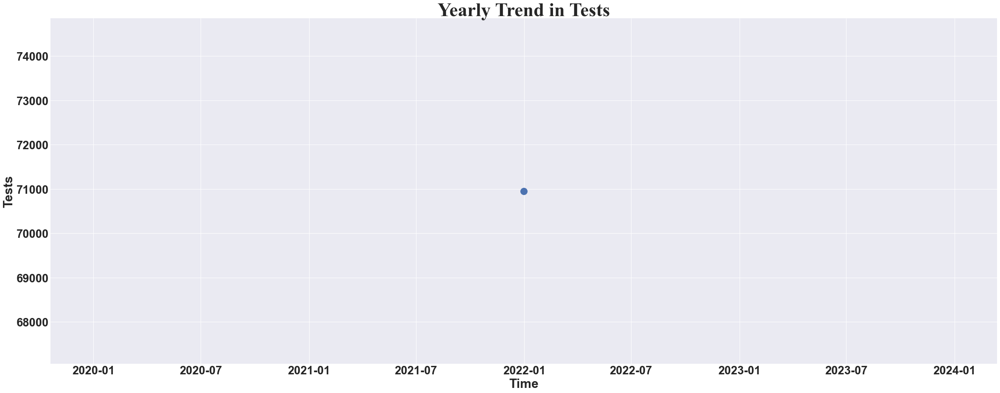

In [79]:
st21 = ST.yearly_trend_2()

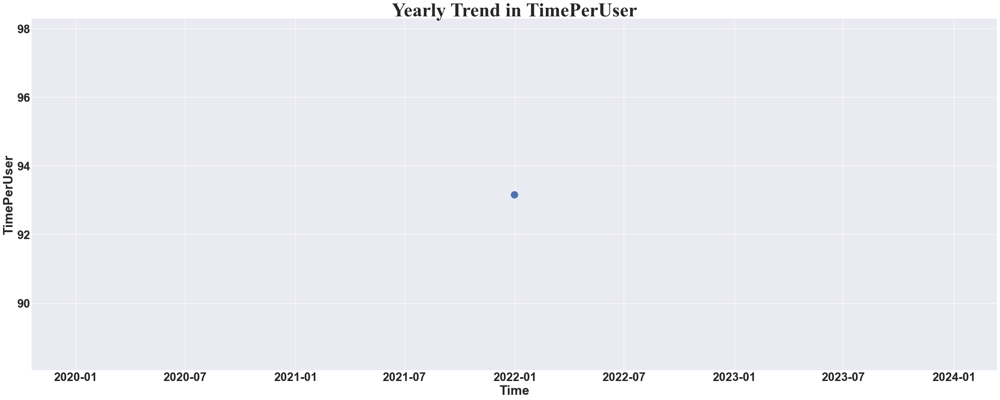

In [80]:
st22 = ST.yearly_trend_3()

# 5. Learn Usage

In [81]:
LU = Learn_Usage(conn, start_date, end_date)

Length of data is: 3346


,OnlineClassId,AffiliationId,CourseId,SubjectId,StartTime,Duration,CourseName,SubjectName
0,132,1291,2,2,2021-09-02 12:25:00,55,9/10 CBSE,Maths
1,222,1136,2,4,2021-09-07 15:18:00,45,9/10 CBSE,Science
2,230,1136,15,4,2021-09-07 16:00:00,60,9/10 SSC,Science
3,233,1136,2,4,2021-09-07 17:00:00,60,9/10 CBSE,Science
4,240,1136,2,4,2021-09-07 18:00:00,60,9/10 CBSE,Science


## Course-wise test analysis

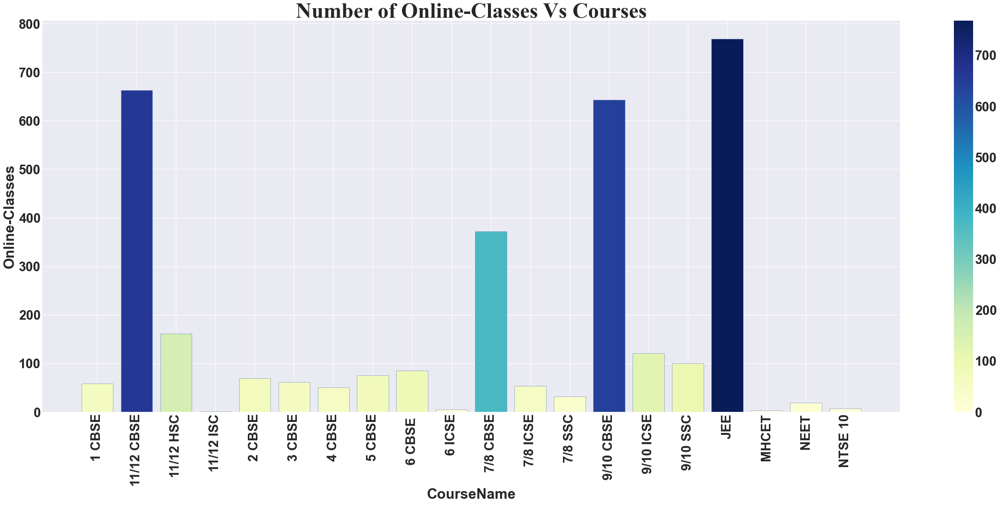

In [82]:
lu1 = LU.coursewise_analysis_1()

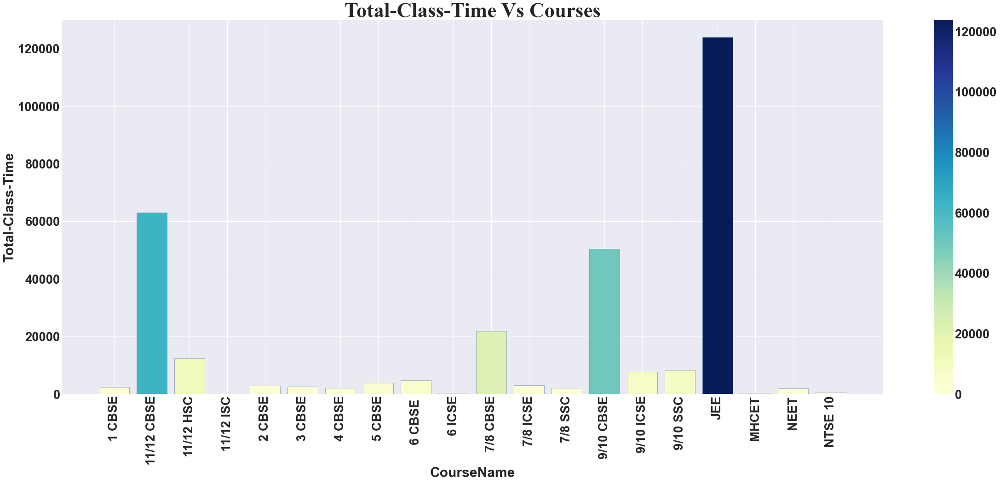

In [83]:
lu2 = LU.coursewise_analysis_2()

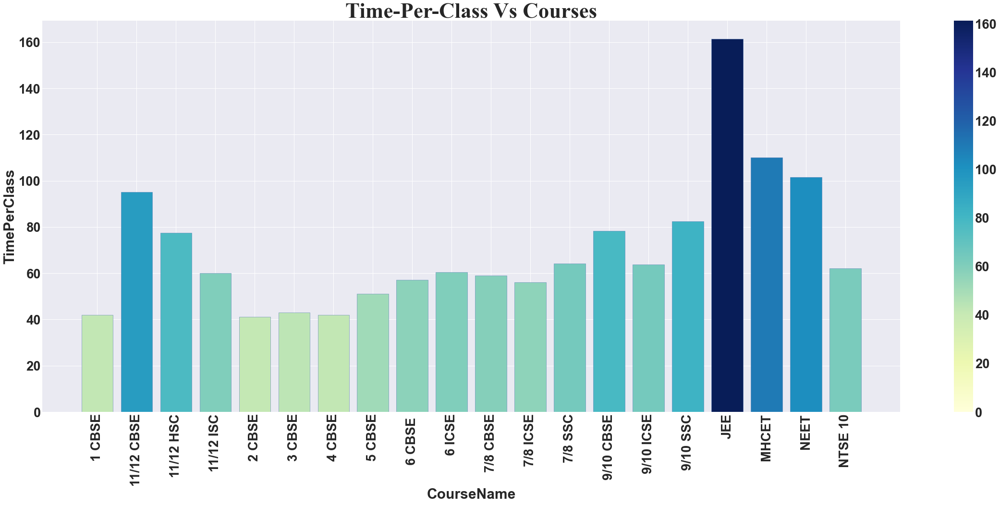

In [84]:
lu3 = LU.coursewise_analysis_3()

## Subject-wise test analysis

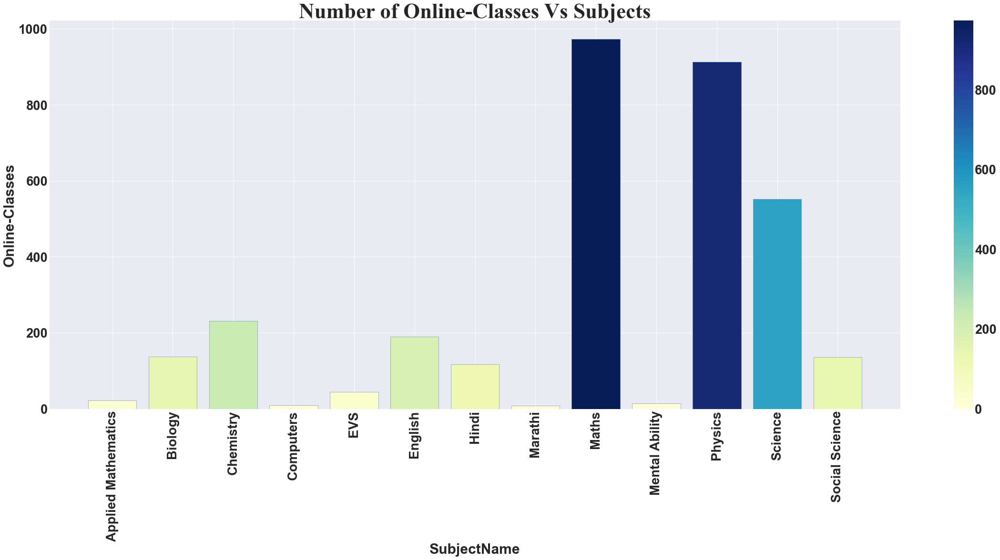

In [85]:
lu4 = LU.subjectwise_analysis_1()

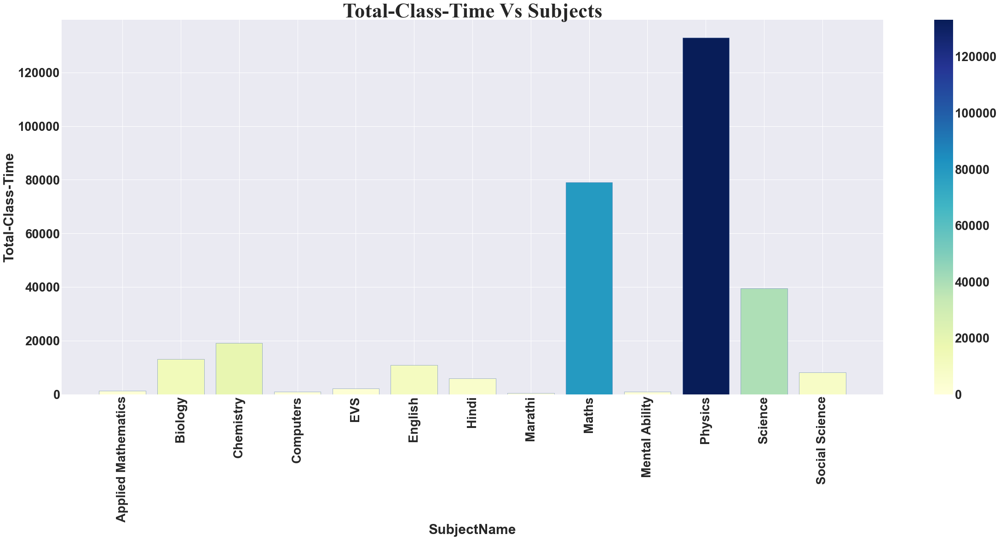

In [86]:
lu5 = LU.subjectwise_analysis_2()

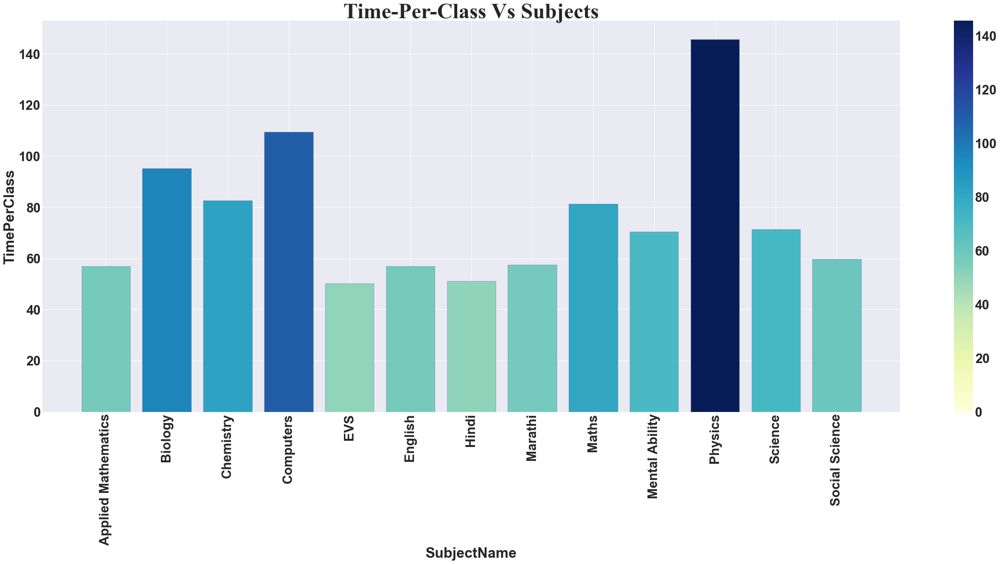

In [87]:
lu6 = LU.subjectwise_analysis_3()

## Affiliation-wise test analysis

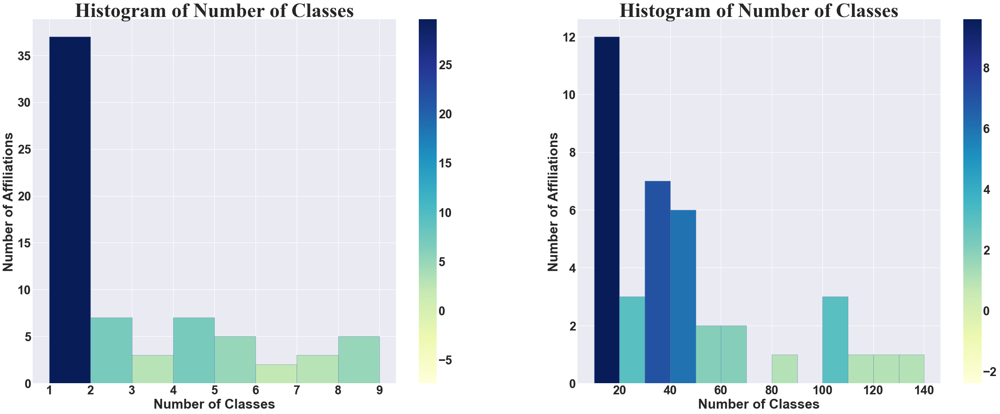

In [88]:
lu7 = LU.affiliationwise_analysis()

## Daily Trend

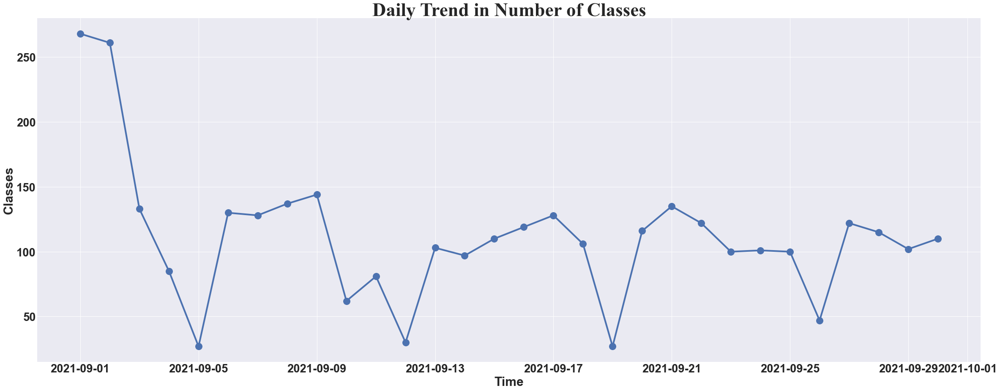

In [89]:
lu8 = LU.daily_trend_1()

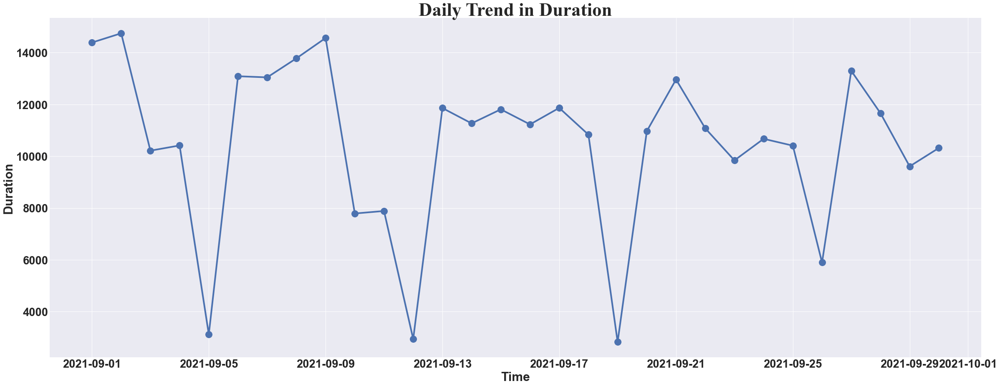

In [90]:
lu9 = LU.daily_trend_2()

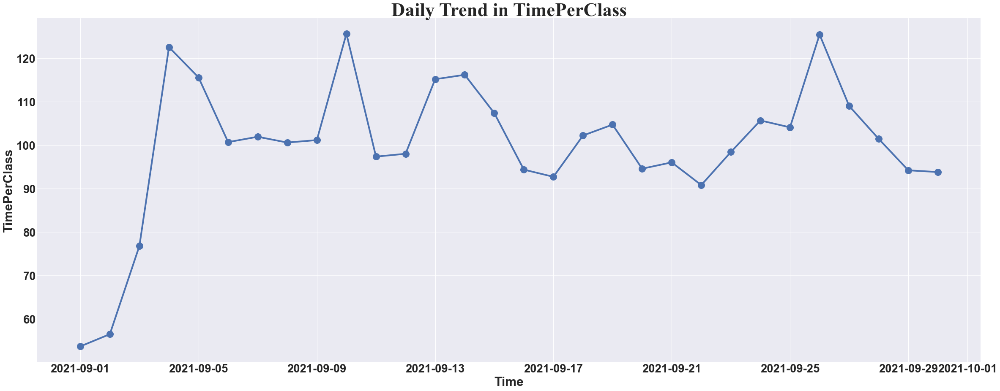

In [91]:
lu10 = LU.daily_trend_3()

## Weekly Trend

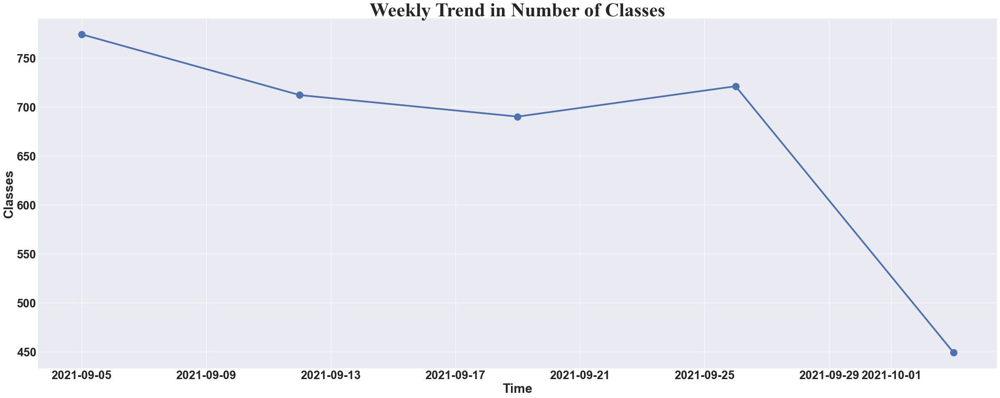

In [92]:
lu11 = LU.weekly_trend_1()

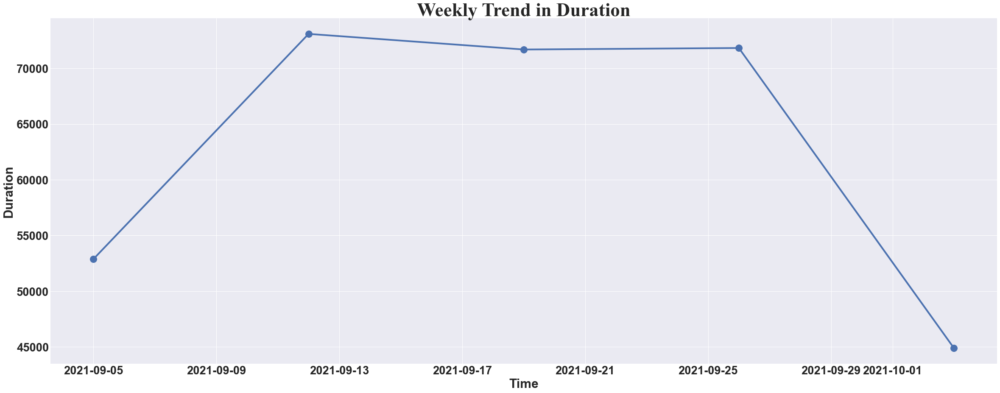

In [93]:
lu12 = LU.weekly_trend_2()

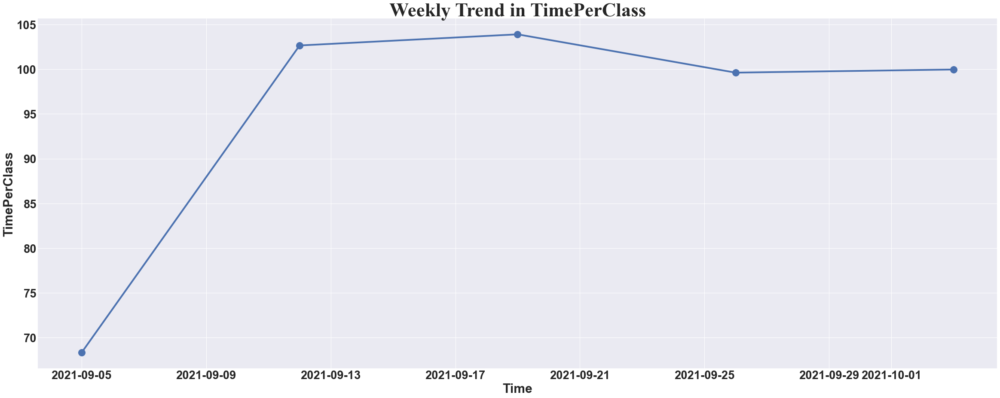

In [94]:
lu13 = LU.weekly_trend_3()

## Monthly Trend

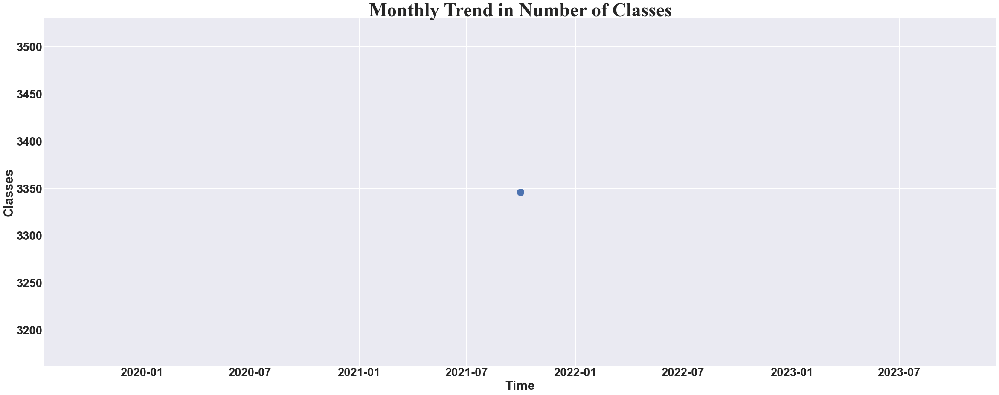

In [95]:
lu14 = LU.monthly_trend_1()

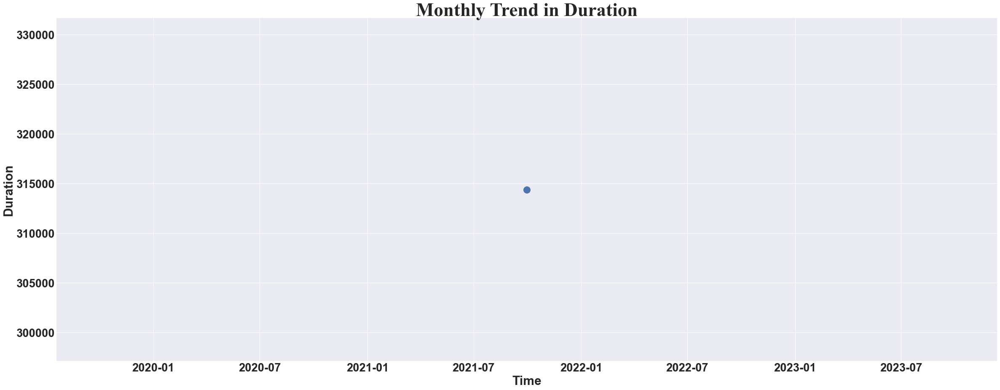

In [96]:
lu15 = LU.monthly_trend_2()

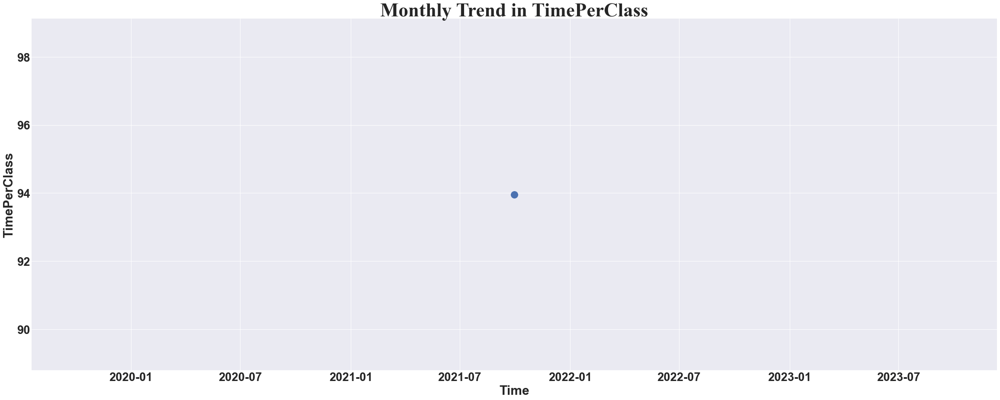

In [97]:
lu16 = LU.monthly_trend_3()

## Quarterly Trend

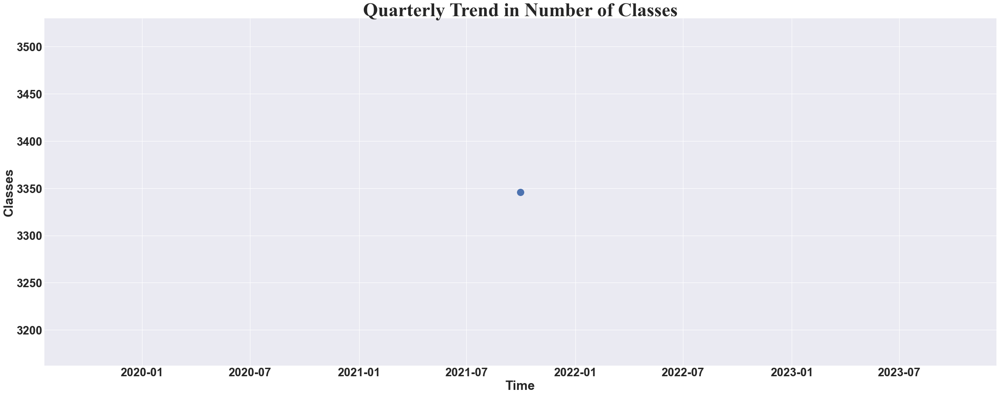

In [98]:
lu17 = LU.quarterly_trend_1()

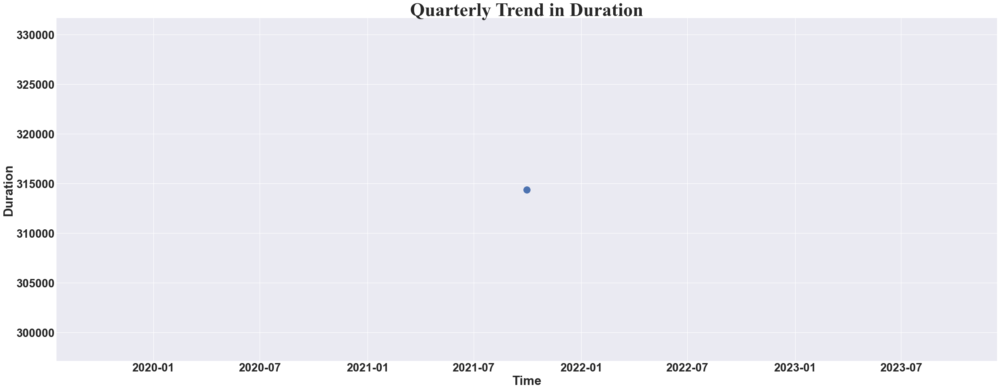

In [99]:
lu18 = LU.quarterly_trend_2()

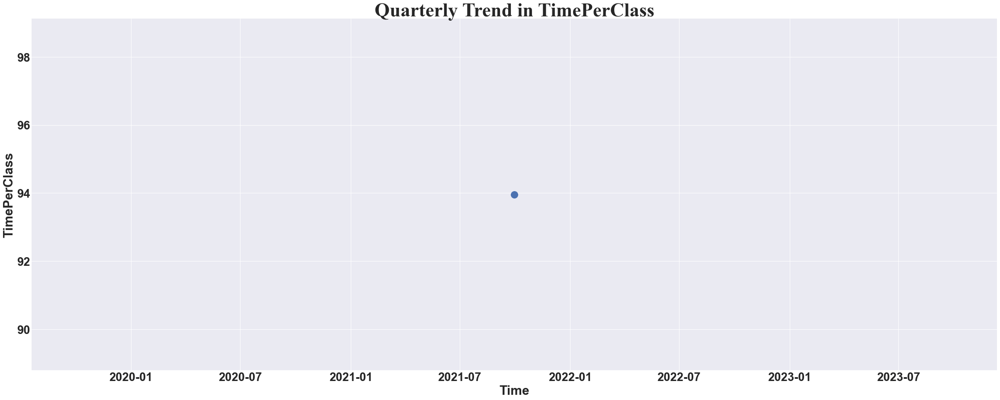

In [100]:
lu19 = LU.quarterly_trend_3()

## Yearly Trend

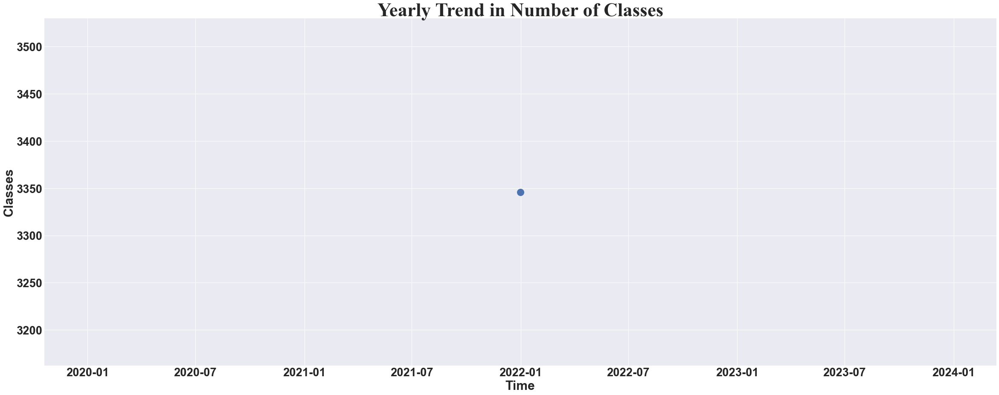

In [101]:
lu20 = LU.yearly_trend_1()

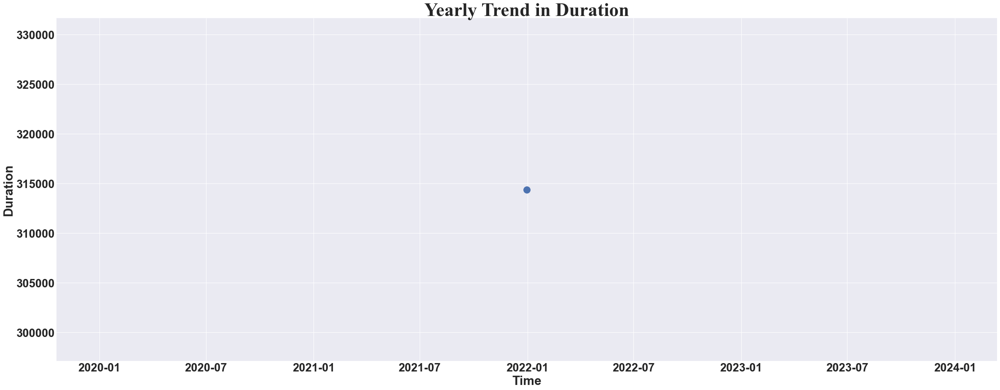

In [102]:
lu21 = LU.yearly_trend_2()

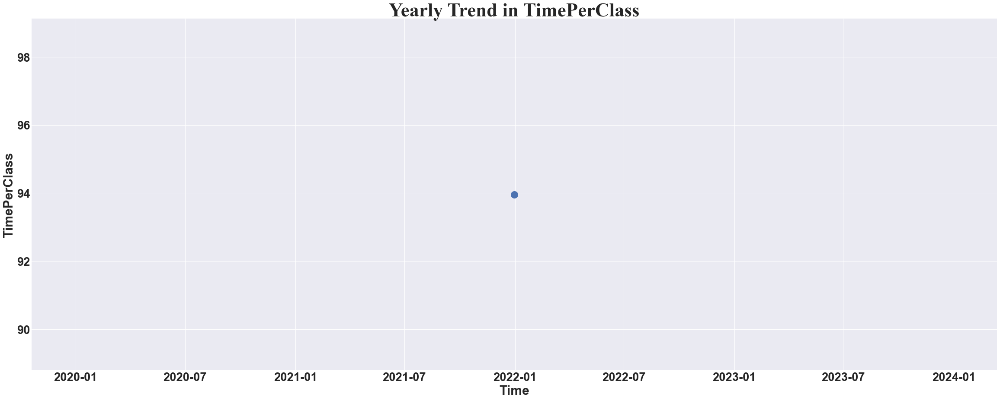

In [103]:
lu22 = LU.yearly_trend_3()